# Exploring Amazon Grocery Market Dynamics: Machine Learning

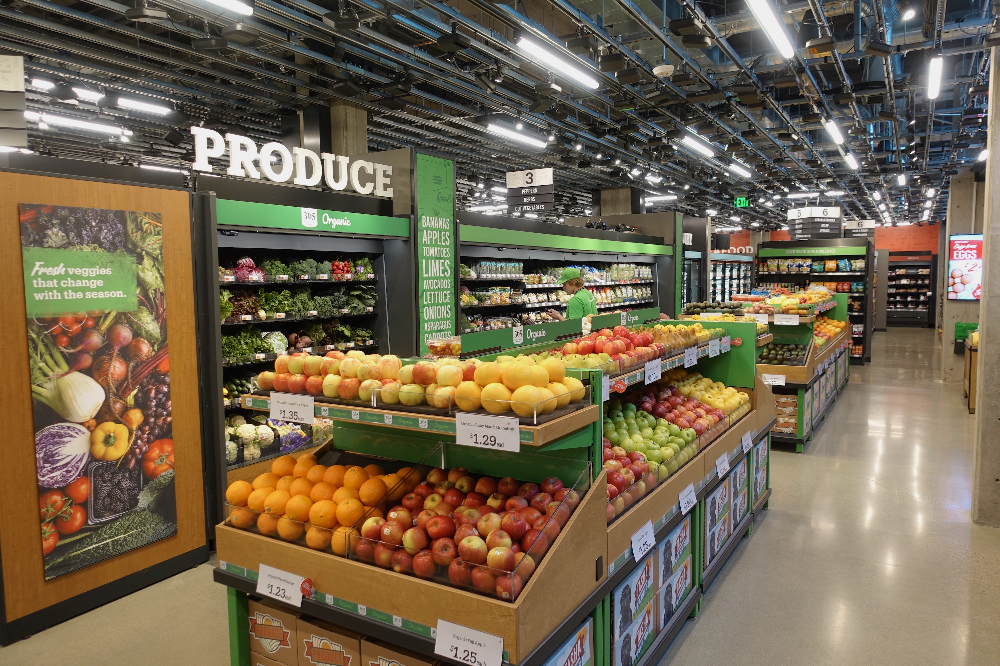

# Importing Necessary Libraries

In [238]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px # is a high-level interface for creating various types of interactive plots with minimal code. 
import plotly.graph_objects as go # is a lower-level interface that offers more control and customization over the appearance and behavior of your plots

In [239]:
import warnings
warnings.filterwarnings('ignore')

# Importing Dataset

In [240]:
path = r"C:\Users\patel\Downloads\archive (1)\dataset.csv"

In [241]:
df = pd.read_csv(path)

# Exploratory Data Analysis

In [242]:
df.head()

,Product Details,ASIN,Brand,Price,Sales,Revenue,BSR,FBA Fees,Active Sellers #,Ratings,Review Count,Images,Review velocity,Buy Box,Category,Size Tier,Delivery,Dimensions,Weight,Creation Date
0,Lindt Lindor Milk Chocolate Truffles Box - The...,B00NW479QO,Lindt,3.50,13466.0,47131.0,3.0,2.62,30.0,5.0,44069.0,12.0,868.0,Amazon,Food Cupboard,Small Oversize,AMZ,4.2x6.3x3.1,0.51,9/26/2014
1,Andrex Toilet Roll - Gentle Clean Toilet Paper...,B004OCO20E,Andrex,18.28,13338.0,243819.0,2.0,8.38,30.0,5.0,40397.0,5.0,830.0,Amazon,Grocery,Large Oversize,AMZ,13.5x21.8x13.0,9.77,2/17/2011
2,Baileys Original Irish Cream Liqueur 1L,B0049NYI7K,BAILEYS,9.99,11194.0,111828.0,4.0,3.93,22.0,5.0,3827.0,6.0,235.0,Amazon,"Beer, Wine & Spirits",Large Oversize,AMZ,3.7x12.2x3.7,3.73,10/21/2010
3,Tassimo Kenco Americano Grande Coffee Pods (Pa...,B016DEGFWI,Tassimo,14.87,13492.0,200626.0,2.0,5.19,11.0,5.0,28800.0,5.0,466.0,Amazon,Fresh & Chilled,Large Oversize,AMZ,6.8x15.5x6.2,3.26,8/4/2010
4,Tassimo Costa Gingerbread Latte Coffee Pods (P...,B07JVF2FCV,Tassimo,45.00,13377.0,601965.0,6.0,11.03,1.0,5.0,27494.0,9.0,223.0,Bountyville,Drinks,Large Oversize,FBA,6.7x15.4x6.1,4.74,9/3/2018


In [243]:
df.tail()

,Product Details,ASIN,Brand,Price,Sales,Revenue,BSR,FBA Fees,Active Sellers #,Ratings,Review Count,Images,Review velocity,Buy Box,Category,Size Tier,Delivery,Dimensions,Weight,Creation Date
6336,García de la Cruz - Organic Extra Virgin Olive...,B089H2CBKP,García DE LA cruz 1872,17.50,162.0,2835.0,6418.0,6.82,1.0,5.0,530.0,4.0,2.0,García de la Cruz,Food Cupboard,Large Oversize,FBA,6.2x11.4x5.5,4.23,7/16/2020
6337,Tree of Life Organic Apple Cider Vinegar with ...,B075WX3V4F,Tree of Life,4.84,931.0,4506.0,7297.0,2.89,1.0,5.0,562.0,6.0,15.0,Amazon,Food Cupboard,Large Oversize,AMZ,4.4x9.5x3.4,1.68,9/24/2017
6338,Kentish Oils Extra Virgin Rapeseed Oil Gift Se...,B011A1FZJI,Kent Crisps Limited,13.93,122.0,1699.0,6486.0,6.27,1.0,5.0,228.0,1.0,1.0,Amazon,Food Cupboard,Large Oversize,AMZ,11.3x14.2x2.8,5.03,7/1/2015
6339,"Biona Organic Apple Cider Vinegar, 500ml",B0013GAEII,Biona,2.85,208.0,593.0,7443.0,2.73,7.0,4.0,260.0,7.0,0.0,Amazon,Food Cupboard,Large Oversize,AMZ,3.5x10.7x3.5,1.81,2/2/2008
6340,Sonnoveld Cake Release Spray Cooking Oil Bakin...,B08G874BS3,Sonneveld,13.99,310.0,4337.0,6679.0,4.74,1.0,5.0,117.0,7.0,9.0,Comfort_Care2,Food Cupboard,Large Oversize,FBA,2.8x12.4x2.8,1.28,8/19/2020


In [244]:
df.shape

(6341, 20)

In [245]:
df.columns

Index(['Product Details', 'ASIN', 'Brand', 'Price', 'Sales', 'Revenue', 'BSR',
       'FBA Fees', 'Active Sellers #', 'Ratings', 'Review Count', 'Images',
       'Review velocity', 'Buy Box', 'Category', 'Size Tier', 'Delivery',
       'Dimensions', 'Weight', 'Creation Date'],
      dtype='object')

In [246]:
df.duplicated().sum()

1250

In [247]:
df.isnull().sum()

Product Details        0
ASIN                   0
Brand                 17
Price               1264
Sales               1802
Revenue             1511
BSR                  453
FBA Fees            2636
Active Sellers #      51
Ratings              828
Review Count         828
Images               492
Review velocity       50
Buy Box             1932
Category               0
Size Tier           1529
Delivery            1089
Dimensions          1516
Weight              1437
Creation Date          1
dtype: int64

In [248]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6341 entries, 0 to 6340
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Product Details   6341 non-null   object 
 1   ASIN              6341 non-null   object 
 2   Brand             6324 non-null   object 
 3   Price             5077 non-null   float64
 4   Sales             4539 non-null   float64
 5   Revenue           4830 non-null   float64
 6   BSR               5888 non-null   float64
 7   FBA Fees          3705 non-null   float64
 8   Active Sellers #  6290 non-null   float64
 9   Ratings           5513 non-null   float64
 10  Review Count      5513 non-null   float64
 11  Images            5849 non-null   float64
 12  Review velocity   6291 non-null   float64
 13  Buy Box           4409 non-null   object 
 14  Category          6341 non-null   object 
 15  Size Tier         4812 non-null   object 
 16  Delivery          5252 non-null   object 


In [249]:
df.describe()

,Price,Sales,Revenue,BSR,FBA Fees,Active Sellers #,Ratings,Review Count,Images,Review velocity,Weight
count,5077.000000,4539.000000,4830.000000,5.888000e+03,3705.000000,6290.000000,5513.000000,5513.000000,5849.000000,6291.000000,4904.000000
mean,15.205212,982.762503,11330.371843,9.781002e+04,5.397206,3.617965,4.589516,870.420461,4.666268,21.152917,5.204541
std,12.576685,2430.146523,37115.305071,1.971163e+05,3.521769,7.290586,0.604482,3014.611763,2.913145,249.247799,14.598992
min,0.500000,0.000000,0.000000,0.000000e+00,0.000000,1.000000,1.000000,1.000000,1.000000,-3680.000000,0.010000
25%,7.100000,11.000000,72.000000,5.037000e+03,3.060000,1.000000,4.000000,10.000000,2.000000,0.000000,0.750000
50%,12.840000,91.000000,823.500000,4.037600e+04,4.780000,1.000000,5.000000,93.000000,5.000000,0.000000,1.960000
75%,20.000000,552.000000,5412.500000,1.364030e+05,7.150000,3.000000,5.000000,458.000000,7.000000,5.000000,5.040000
max,254.990000,23288.000000,601965.000000,4.405945e+06,137.000000,135.000000,5.000000,66998.000000,25.000000,9132.000000,881.850000


# Data Cleaning and Preprocessing

In [250]:
df.duplicated().sum()

1250

In [251]:
df = df.drop_duplicates()

In [252]:
column_name_mapping = {
    'Product Details': 'product_details',
    'ASIN': 'asin',
    'Brand': 'brand',
    'Price': 'price',
    'Sales': 'sales',
    'Revenue': 'revenue',
    'BSR': 'best_seller_rank',
    'FBA Fees': 'fba_fees',
    'Active Sellers #': 'active_sellers',
    'Ratings': 'ratings',
    'Review Count': 'review_count',
    'Images': 'images',
    'Review velocity': 'review_velocity',
    'Buy Box': 'buy_box',
    'Category': 'category',
    'Size Tier': 'size_tier',
    'Delivery': 'delivery',
    'Dimensions': 'dimensions',
    'Weight': 'weight',
    'Creation Date': 'creation_date'
}

df = df.rename(columns=column_name_mapping)

In [253]:

#here seperated object and numerical columns
object_columns = df.select_dtypes(include='object').columns.tolist()
numerical_columns = df.select_dtypes(include=['int', 'float']).columns.tolist()

print("Object columns:", object_columns)
print('\n')
print("Numerical columns:", numerical_columns)

Object columns: ['product_details', 'asin', 'brand', 'buy_box', 'category', 'size_tier', 'delivery', 'dimensions', 'creation_date']


Numerical columns: ['price', 'sales', 'revenue', 'best_seller_rank', 'fba_fees', 'active_sellers', 'ratings', 'review_count', 'images', 'review_velocity', 'weight']


In [254]:
#function for defining discrete and continuous
#here i am assuming if values_count is less than it is a discrete type
def identify_numeric_type(df, column_name):
    unique_values_count = len(df[column_name].unique())
    if unique_values_count < 10:
        return 'Discrete'
    else:
        return 'Continuous'

In [255]:
#seperate continuous columns and discrete columns
continuous_columns = []
discrete_columns = []
for column_name in numerical_columns:
    numeric_type = identify_numeric_type(df, column_name)
    print(f'The numerical column"{column_name}" is {numeric_type}.')
    if(numeric_type == 'Continuous'):
        continuous_columns.append(column_name)
    else:
        discrete_columns.append(column_name)
    

The numerical column"price" is Continuous.
The numerical column"sales" is Continuous.
The numerical column"revenue" is Continuous.
The numerical column"best_seller_rank" is Continuous.
The numerical column"fba_fees" is Continuous.
The numerical column"active_sellers" is Continuous.
The numerical column"ratings" is Discrete.
The numerical column"review_count" is Continuous.
The numerical column"images" is Continuous.
The numerical column"review_velocity" is Continuous.
The numerical column"weight" is Continuous.


In [256]:
print(continuous_columns)
print(discrete_columns)

['price', 'sales', 'revenue', 'best_seller_rank', 'fba_fees', 'active_sellers', 'review_count', 'images', 'review_velocity', 'weight']
['ratings']


In [257]:
#imputing null values of continuous column  with mean() 
for col in continuous_columns:
    df[col].fillna(df[col].mean(), inplace=True)

In [258]:
#imputing null values of discrete columns with mode()[0]
for col in discrete_columns:
    df[col].fillna(df[col].mode()[0], inplace=True)

For each column (col), it calculates the mode (most frequent value) of that column using the mode() function. The mode function returns a DataFrame containing the mode(s) for each column. Since we're interested in the most frequent value (assuming there is only one mode), we use [0] to select the first mode.

In [259]:
#filling null values with topmost mode 
for col in object_columns:
    df[col].fillna(df[col].mode()[0], inplace=True)

In [260]:
#checking for null values
df.isnull().sum()

product_details     0
asin                0
brand               0
price               0
sales               0
revenue             0
best_seller_rank    0
fba_fees            0
active_sellers      0
ratings             0
review_count        0
images              0
review_velocity     0
buy_box             0
category            0
size_tier           0
delivery            0
dimensions          0
weight              0
creation_date       0
dtype: int64

In [261]:
df.nunique()

product_details     5049
asin                5071
brand               1565
price               1333
sales               1120
revenue             2095
best_seller_rank    4510
fba_fees             791
active_sellers        59
ratings                5
review_count        1183
images                19
review_velocity      244
buy_box              746
category              23
size_tier              7
delivery               3
dimensions          3419
weight               892
creation_date       1907
dtype: int64

In [262]:
#defining a function to distinguish between categorical and non categorical columns
def identify_object_categorical_type(df, column_name):
    unique_values_count = len(df[column_name].unique())
    if unique_values_count < 10:
        return 'Categorical'
    else:
        return 'Non Categorical'

In [263]:
categorical_columns = []
non_categorical_columns = []
for column_name in object_columns:
    category_type = identify_object_categorical_type(df, column_name)
    print(f'The "{column_name}" column is {category_type}.')
    if(category_type == 'Categorical'):
        categorical_columns.append(column_name)
    else:
        non_categorical_columns.append(column_name)
        
    

The "product_details" column is Non Categorical.
The "asin" column is Non Categorical.
The "brand" column is Non Categorical.
The "buy_box" column is Non Categorical.
The "category" column is Non Categorical.
The "size_tier" column is Categorical.
The "delivery" column is Categorical.
The "dimensions" column is Non Categorical.
The "creation_date" column is Non Categorical.


In [264]:
print(categorical_columns)
print(non_categorical_columns)

['size_tier', 'delivery']
['product_details', 'asin', 'brand', 'buy_box', 'category', 'dimensions', 'creation_date']


In [265]:
for i in categorical_columns:
    print(i)
    print(df[i].unique())
    print('\n')

size_tier
['Small Oversize' 'Large Oversize' 'Standard Parcel' 'Large Envelope'
 'Small Envelope' 'Standard Envelope' 'Large Letter']


delivery
['AMZ' 'FBA' 'MFN']




In [266]:
for i in categorical_columns:
    print(i)
    print(df[i].value_counts())
    print('\n')

size_tier
size_tier
Large Oversize       4397
Small Oversize        418
Standard Parcel       237
Large Envelope         22
Standard Envelope       9
Large Letter            5
Small Envelope          3
Name: count, dtype: int64


delivery
delivery
MFN    2739
AMZ    1224
FBA    1128
Name: count, dtype: int64




# Data Visualization

In [267]:
df

,product_details,asin,brand,price,sales,revenue,best_seller_rank,fba_fees,active_sellers,ratings,review_count,images,review_velocity,buy_box,category,size_tier,delivery,dimensions,weight,creation_date
0,Lindt Lindor Milk Chocolate Truffles Box - The...,B00NW479QO,Lindt,3.50,13466.0,47131.0,3.0,2.62,30.0,5.0,44069.0,12.0,868.0,Amazon,Food Cupboard,Small Oversize,AMZ,4.2x6.3x3.1,0.51,9/26/2014
1,Andrex Toilet Roll - Gentle Clean Toilet Paper...,B004OCO20E,Andrex,18.28,13338.0,243819.0,2.0,8.38,30.0,5.0,40397.0,5.0,830.0,Amazon,Grocery,Large Oversize,AMZ,13.5x21.8x13.0,9.77,2/17/2011
2,Baileys Original Irish Cream Liqueur 1L,B0049NYI7K,BAILEYS,9.99,11194.0,111828.0,4.0,3.93,22.0,5.0,3827.0,6.0,235.0,Amazon,"Beer, Wine & Spirits",Large Oversize,AMZ,3.7x12.2x3.7,3.73,10/21/2010
3,Tassimo Kenco Americano Grande Coffee Pods (Pa...,B016DEGFWI,Tassimo,14.87,13492.0,200626.0,2.0,5.19,11.0,5.0,28800.0,5.0,466.0,Amazon,Fresh & Chilled,Large Oversize,AMZ,6.8x15.5x6.2,3.26,8/4/2010
4,Tassimo Costa Gingerbread Latte Coffee Pods (P...,B07JVF2FCV,Tassimo,45.00,13377.0,601965.0,6.0,11.03,1.0,5.0,27494.0,9.0,223.0,Bountyville,Drinks,Large Oversize,FBA,6.7x15.4x6.1,4.74,9/3/2018
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6336,García de la Cruz - Organic Extra Virgin Olive...,B089H2CBKP,García DE LA cruz 1872,17.50,162.0,2835.0,6418.0,6.82,1.0,5.0,530.0,4.0,2.0,García de la Cruz,Food Cupboard,Large Oversize,FBA,6.2x11.4x5.5,4.23,7/16/2020
6337,Tree of Life Organic Apple Cider Vinegar with ...,B075WX3V4F,Tree of Life,4.84,931.0,4506.0,7297.0,2.89,1.0,5.0,562.0,6.0,15.0,Amazon,Food Cupboard,Large Oversize,AMZ,4.4x9.5x3.4,1.68,9/24/2017
6338,Kentish Oils Extra Virgin Rapeseed Oil Gift Se...,B011A1FZJI,Kent Crisps Limited,13.93,122.0,1699.0,6486.0,6.27,1.0,5.0,228.0,1.0,1.0,Amazon,Food Cupboard,Large Oversize,AMZ,11.3x14.2x2.8,5.03,7/1/2015
6339,"Biona Organic Apple Cider Vinegar, 500ml",B0013GAEII,Biona,2.85,208.0,593.0,7443.0,2.73,7.0,4.0,260.0,7.0,0.0,Amazon,Food Cupboard,Large Oversize,AMZ,3.5x10.7x3.5,1.81,2/2/2008


In [268]:
#converting date into this format Y-m-d(2014-09-26)
df['creation_date'] = pd.to_datetime(df['creation_date'], format='%m/%d/%Y', errors='coerce')

In [269]:
df.head()

,product_details,asin,brand,price,sales,revenue,best_seller_rank,fba_fees,active_sellers,ratings,review_count,images,review_velocity,buy_box,category,size_tier,delivery,dimensions,weight,creation_date
0,Lindt Lindor Milk Chocolate Truffles Box - The...,B00NW479QO,Lindt,3.50,13466.0,47131.0,3.0,2.62,30.0,5.0,44069.0,12.0,868.0,Amazon,Food Cupboard,Small Oversize,AMZ,4.2x6.3x3.1,0.51,2014-09-26
1,Andrex Toilet Roll - Gentle Clean Toilet Paper...,B004OCO20E,Andrex,18.28,13338.0,243819.0,2.0,8.38,30.0,5.0,40397.0,5.0,830.0,Amazon,Grocery,Large Oversize,AMZ,13.5x21.8x13.0,9.77,2011-02-17
2,Baileys Original Irish Cream Liqueur 1L,B0049NYI7K,BAILEYS,9.99,11194.0,111828.0,4.0,3.93,22.0,5.0,3827.0,6.0,235.0,Amazon,"Beer, Wine & Spirits",Large Oversize,AMZ,3.7x12.2x3.7,3.73,2010-10-21
3,Tassimo Kenco Americano Grande Coffee Pods (Pa...,B016DEGFWI,Tassimo,14.87,13492.0,200626.0,2.0,5.19,11.0,5.0,28800.0,5.0,466.0,Amazon,Fresh & Chilled,Large Oversize,AMZ,6.8x15.5x6.2,3.26,2010-08-04
4,Tassimo Costa Gingerbread Latte Coffee Pods (P...,B07JVF2FCV,Tassimo,45.00,13377.0,601965.0,6.0,11.03,1.0,5.0,27494.0,9.0,223.0,Bountyville,Drinks,Large Oversize,FBA,6.7x15.4x6.1,4.74,2018-09-03


In [270]:
# Find the minimum and maximum dates
start_date = df['creation_date'].min()
end_date = df['creation_date'].max()

print("Starting Date:", start_date)
print("Ending Date:", end_date)

Starting Date: 2006-01-01 00:00:00
Ending Date: 2021-11-18 00:00:00


1. **`df.set_index('creation_date')`**: This sets the 'creation_date' column as the index of the DataFrame `df`. The `set_index` function in Pandas is used to set a specific column as the index for the DataFrame.

2. **`.resample('D')`**: This is a method used for time series data in Pandas. It allows you to group the data based on a specific time frequency. In this case, `'D'` stands for daily. So, it's resampling the data to a daily frequency.

3. **`.sum()`**: After resampling the data to a daily frequency, this function computes the sum of each column for each day. This is often used when you have numeric data and you want to aggregate it for a specific time period.

4. **`.reset_index()`**: Finally, `reset_index` is called to reset the index of the DataFrame back to the default integer-based index, and the 'creation_date' becomes a regular column again.

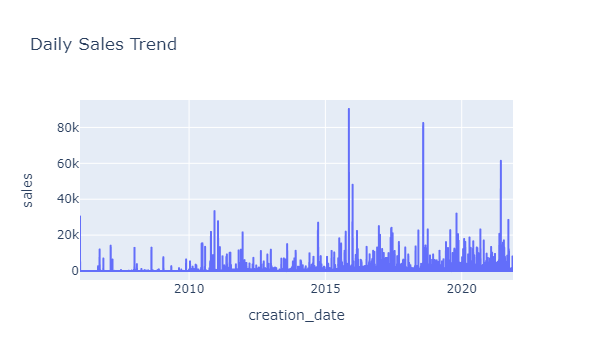

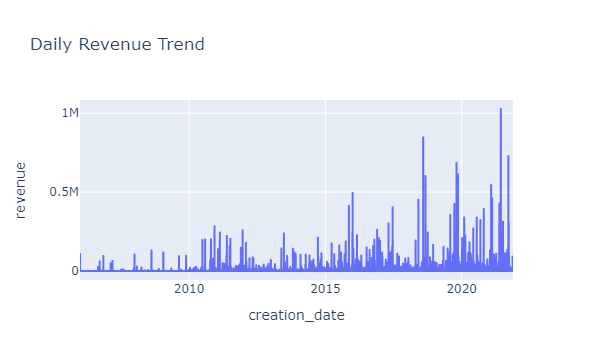

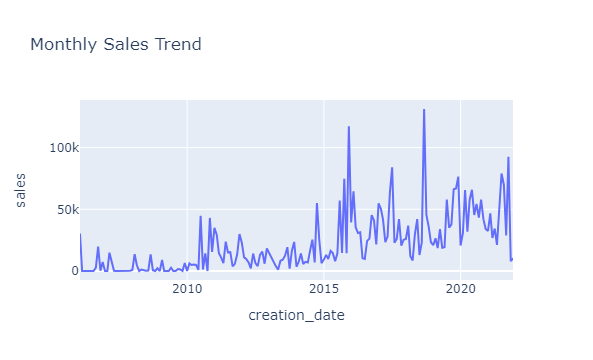

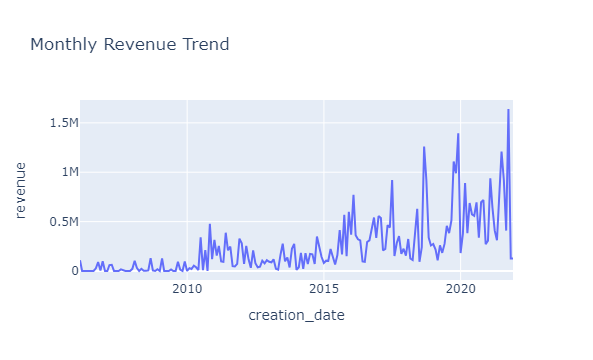

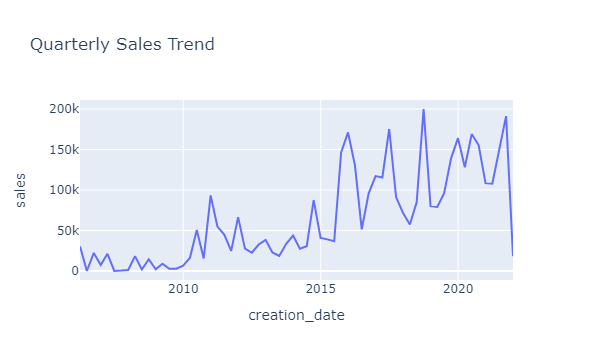

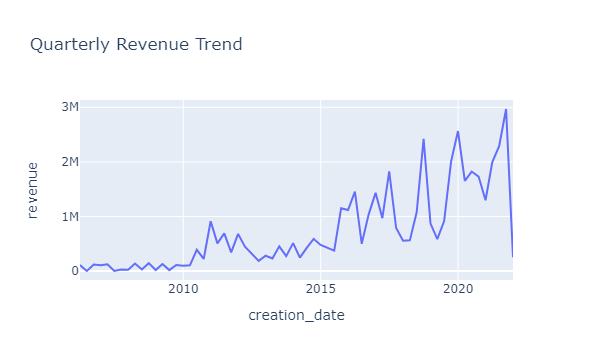

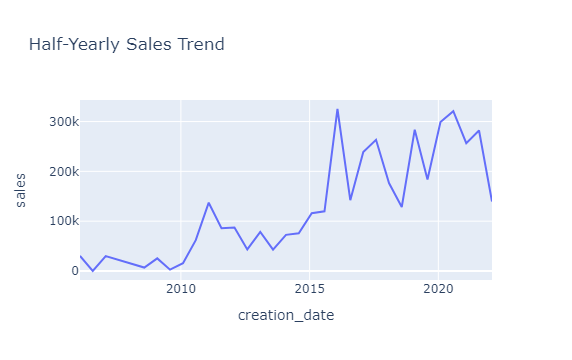

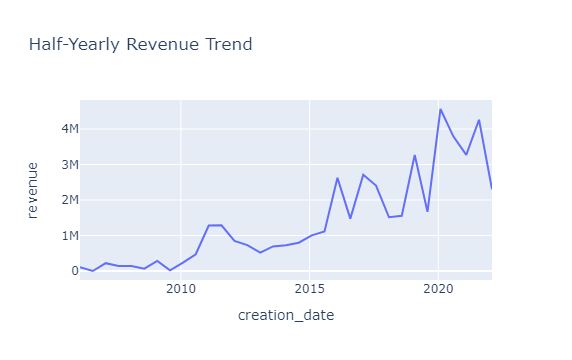

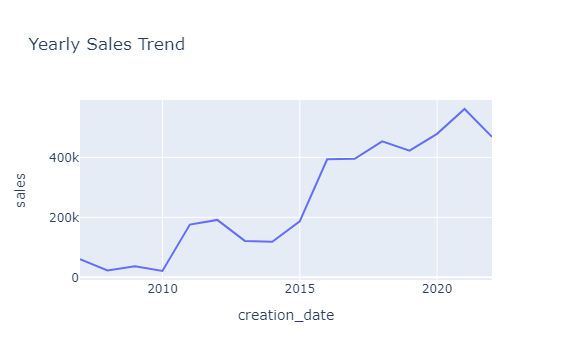

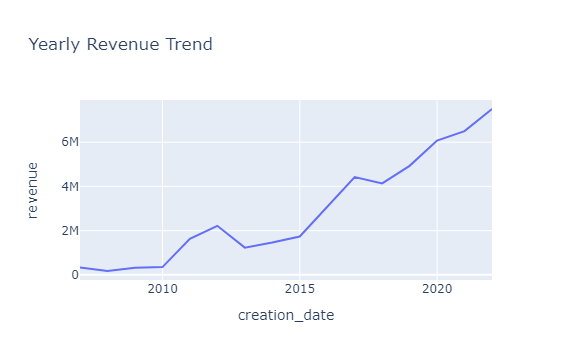

In [271]:
# Daily trend analysis
daily_data = df.set_index('creation_date').resample('D').sum().reset_index()
fig_daily_sales = px.line(daily_data, x='creation_date', y='sales', title='Daily Sales Trend')
fig_daily_revenue = px.line(daily_data, x='creation_date', y='revenue', title='Daily Revenue Trend')

# Monthly trend analysis
monthly_data = df.set_index('creation_date').resample('M').sum().reset_index()
fig_monthly_sales = px.line(monthly_data, x='creation_date', y='sales', title='Monthly Sales Trend')
fig_monthly_revenue = px.line(monthly_data, x='creation_date', y='revenue', title='Monthly Revenue Trend')

# Quarterly trend analysis
quarterly_data = df.set_index('creation_date').resample('Q').sum().reset_index()
fig_quarterly_sales = px.line(quarterly_data, x='creation_date', y='sales', title='Quarterly Sales Trend')
fig_quarterly_revenue = px.line(quarterly_data, x='creation_date', y='revenue', title='Quarterly Revenue Trend')

# Half-yearly trend analysis
half_yearly_data = df.set_index('creation_date').resample('6M').sum().reset_index()
fig_half_yearly_sales = px.line(half_yearly_data, x='creation_date', y='sales', title='Half-Yearly Sales Trend')
fig_half_yearly_revenue = px.line(half_yearly_data, x='creation_date', y='revenue', title='Half-Yearly Revenue Trend')

# Yearly trend analysis
yearly_data = df.set_index('creation_date').resample('Y').sum().reset_index()
fig_yearly_sales = px.line(yearly_data, x='creation_date', y='sales', title='Yearly Sales Trend')
fig_yearly_revenue = px.line(yearly_data, x='creation_date', y='revenue', title='Yearly Revenue Trend')

# Show the plots
fig_daily_sales.show()
fig_daily_revenue.show()
fig_monthly_sales.show()
fig_monthly_revenue.show()
fig_quarterly_sales.show()
fig_quarterly_revenue.show()
fig_half_yearly_sales.show()
fig_half_yearly_revenue.show()
fig_yearly_sales.show()
fig_yearly_revenue.show()

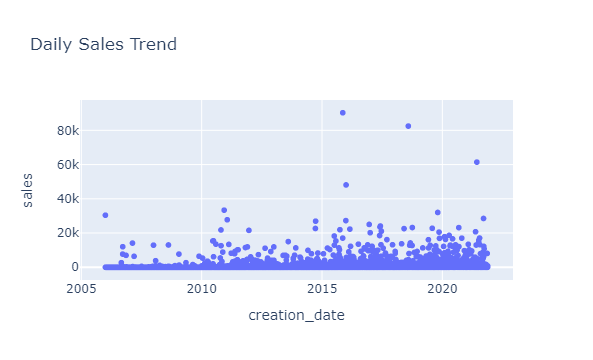

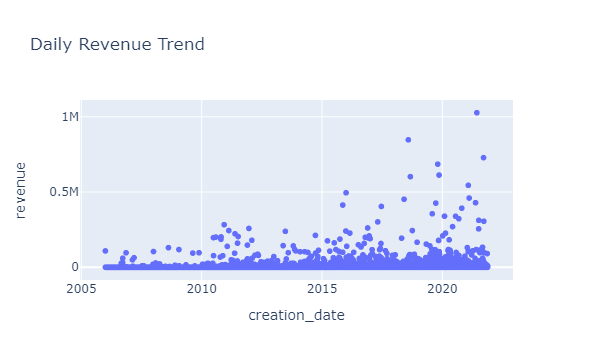

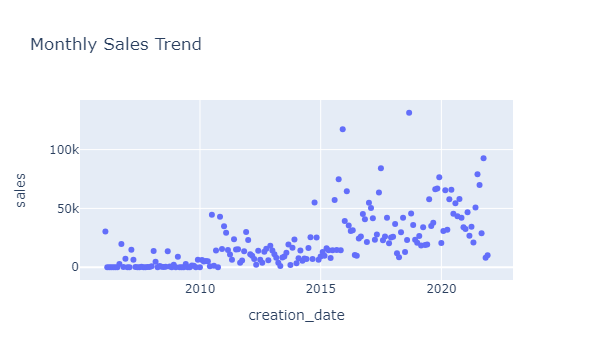

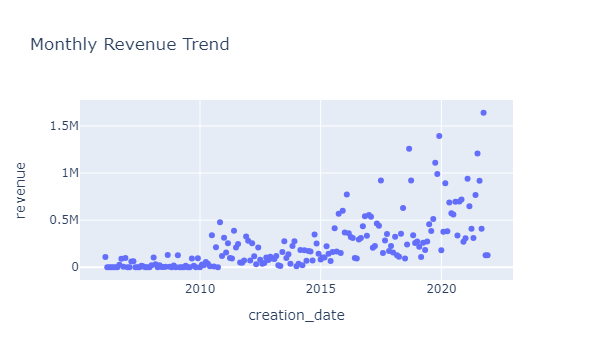

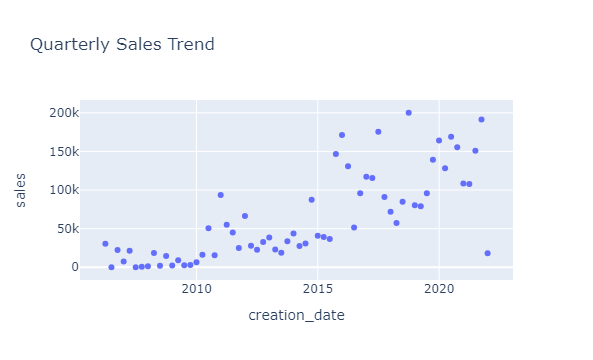

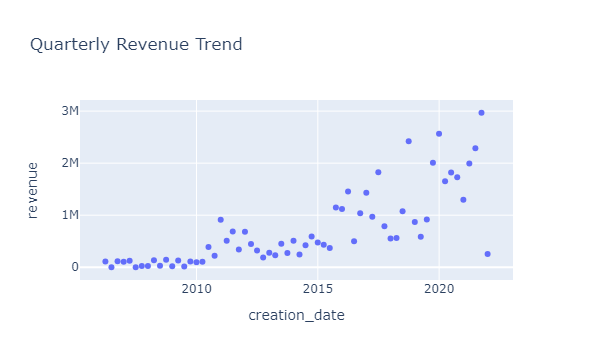

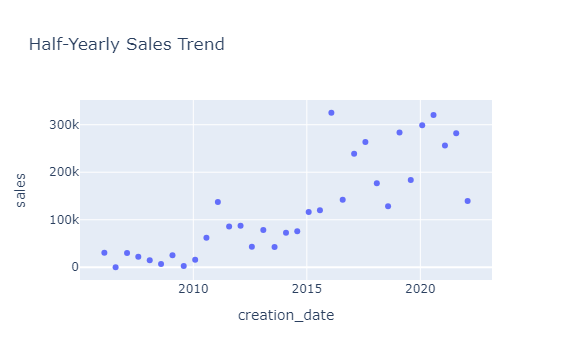

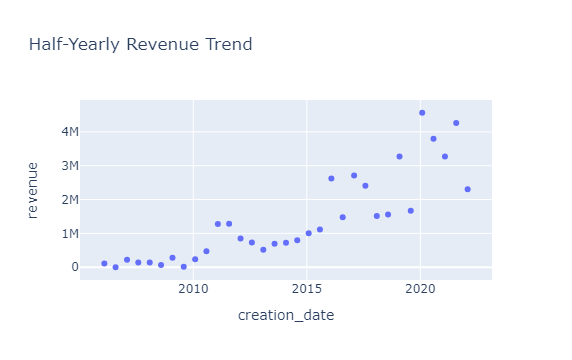

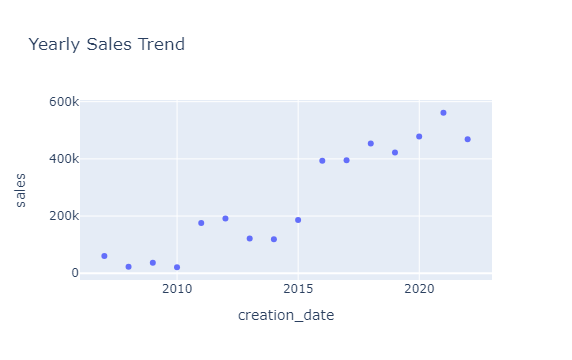

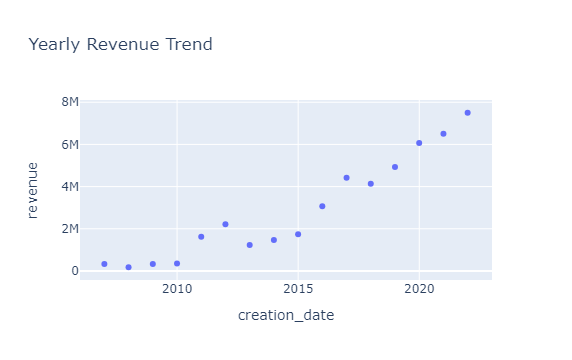

In [272]:
# Daily trend analysis
daily_data = df.set_index('creation_date').resample('D').sum().reset_index()
fig_daily_sales = px.scatter(daily_data, x='creation_date', y='sales', title='Daily Sales Trend')
fig_daily_revenue = px.scatter(daily_data, x='creation_date', y='revenue', title='Daily Revenue Trend')

# Monthly trend analysis
monthly_data = df.set_index('creation_date').resample('M').sum().reset_index()
fig_monthly_sales = px.scatter(monthly_data, x='creation_date', y='sales', title='Monthly Sales Trend')
fig_monthly_revenue = px.scatter(monthly_data, x='creation_date', y='revenue', title='Monthly Revenue Trend')

# Quarterly trend analysis
quarterly_data = df.set_index('creation_date').resample('Q').sum().reset_index()
fig_quarterly_sales = px.scatter(quarterly_data, x='creation_date', y='sales', title='Quarterly Sales Trend')
fig_quarterly_revenue = px.scatter(quarterly_data, x='creation_date', y='revenue', title='Quarterly Revenue Trend')

# Half-yearly trend analysis
half_yearly_data = df.set_index('creation_date').resample('6M').sum().reset_index()
fig_half_yearly_sales = px.scatter(half_yearly_data, x='creation_date', y='sales', title='Half-Yearly Sales Trend')
fig_half_yearly_revenue = px.scatter(half_yearly_data, x='creation_date', y='revenue', title='Half-Yearly Revenue Trend')

# Yearly trend analysis
yearly_data = df.set_index('creation_date').resample('Y').sum().reset_index()
fig_yearly_sales = px.scatter(yearly_data, x='creation_date', y='sales', title='Yearly Sales Trend')
fig_yearly_revenue = px.scatter(yearly_data, x='creation_date', y='revenue', title='Yearly Revenue Trend')

# Show the plots
fig_daily_sales.show()
fig_daily_revenue.show()
fig_monthly_sales.show()
fig_monthly_revenue.show()
fig_quarterly_sales.show()
fig_quarterly_revenue.show()
fig_half_yearly_sales.show()
fig_half_yearly_revenue.show()
fig_yearly_sales.show()
fig_yearly_revenue.show()

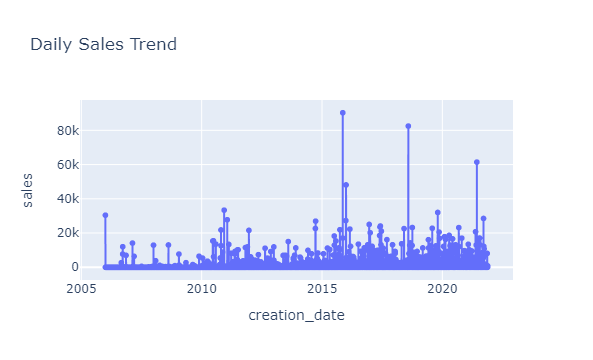

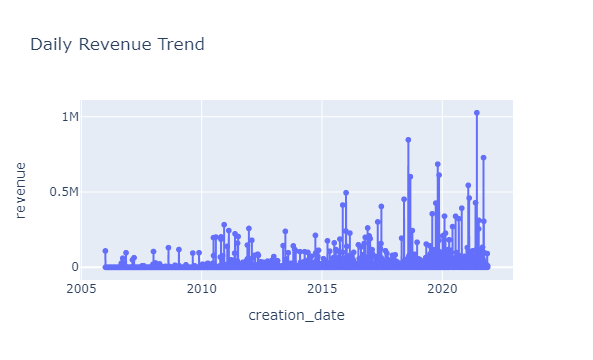

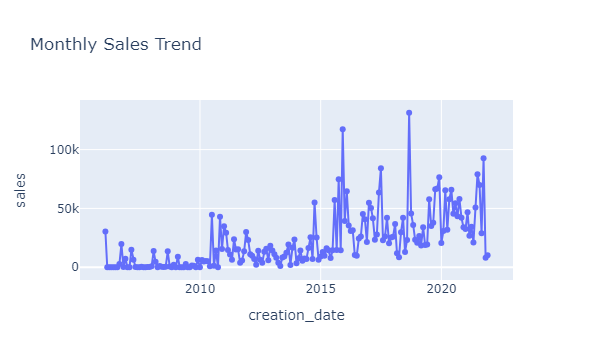

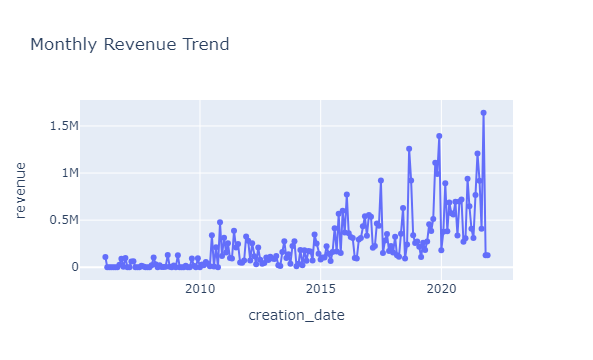

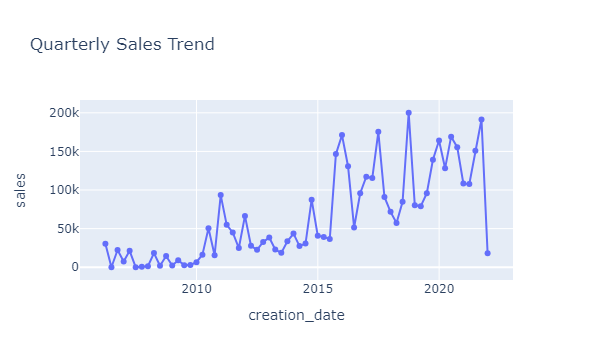

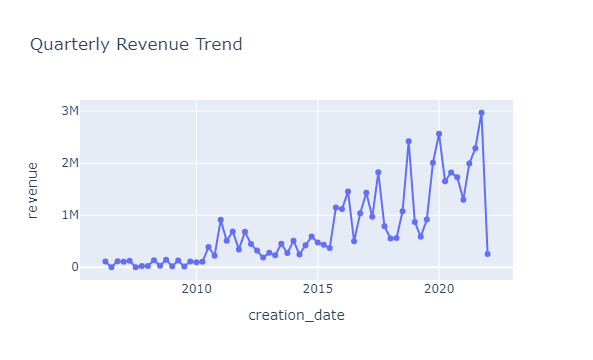

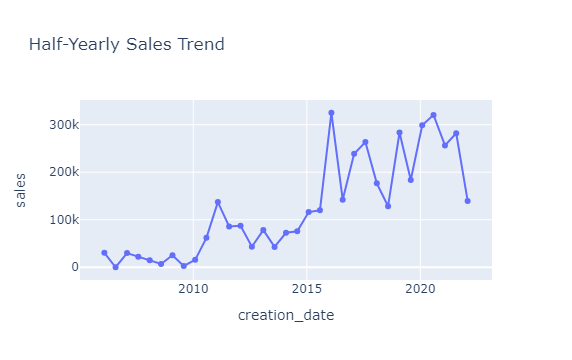

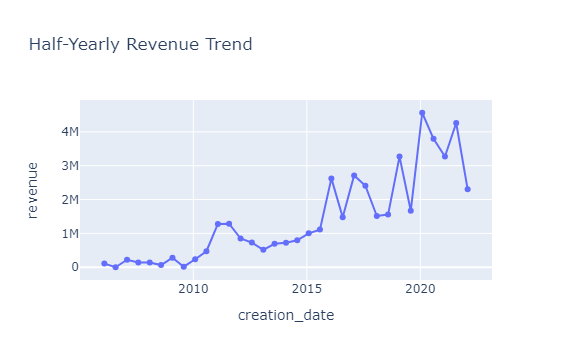

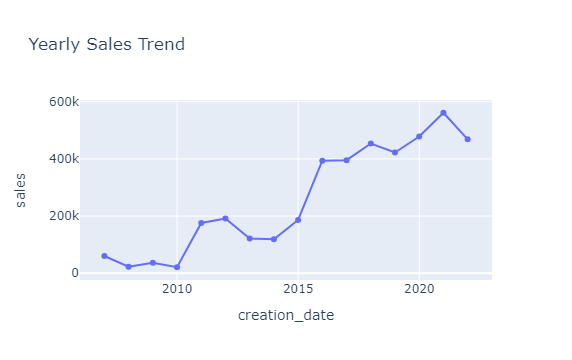

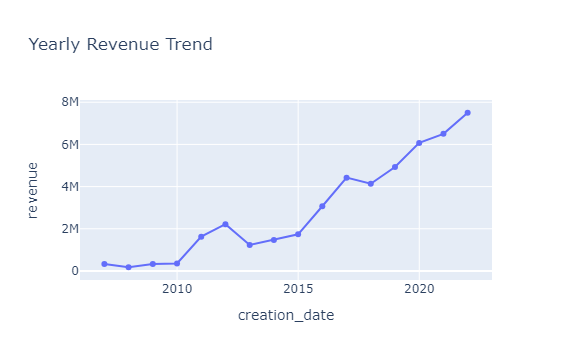

In [273]:
# Daily trend analysis line with markers
daily_data = df.set_index('creation_date').resample('D').sum().reset_index()
fig_daily_sales = px.line(daily_data, x='creation_date', y='sales', title='Daily Sales Trend')
fig_daily_sales.update_traces(mode='lines+markers')

fig_daily_revenue = px.line(daily_data, x='creation_date', y='revenue', title='Daily Revenue Trend')
fig_daily_revenue.update_traces(mode='lines+markers')

# Monthly trend analysis
monthly_data = df.set_index('creation_date').resample('M').sum().reset_index()
fig_monthly_sales = px.line(monthly_data, x='creation_date', y='sales', title='Monthly Sales Trend')
fig_monthly_sales.update_traces(mode='lines+markers')

fig_monthly_revenue = px.line(monthly_data, x='creation_date', y='revenue', title='Monthly Revenue Trend')
fig_monthly_revenue.update_traces(mode='lines+markers')

# Quarterly trend analysis
quarterly_data = df.set_index('creation_date').resample('Q').sum().reset_index()
fig_quarterly_sales = px.line(quarterly_data, x='creation_date', y='sales', title='Quarterly Sales Trend')
fig_quarterly_sales.update_traces(mode='lines+markers')

fig_quarterly_revenue = px.line(quarterly_data, x='creation_date', y='revenue', title='Quarterly Revenue Trend')
fig_quarterly_revenue.update_traces(mode='lines+markers')

# Half-yearly trend analysis
half_yearly_data = df.set_index('creation_date').resample('6M').sum().reset_index()
fig_half_yearly_sales = px.line(half_yearly_data, x='creation_date', y='sales', title='Half-Yearly Sales Trend')
fig_half_yearly_sales.update_traces(mode='lines+markers')

fig_half_yearly_revenue = px.line(half_yearly_data, x='creation_date', y='revenue', title='Half-Yearly Revenue Trend')
fig_half_yearly_revenue.update_traces(mode='lines+markers')

# Yearly trend analysis
yearly_data = df.set_index('creation_date').resample('Y').sum().reset_index()
fig_yearly_sales = px.line(yearly_data, x='creation_date', y='sales', title='Yearly Sales Trend')
fig_yearly_sales.update_traces(mode='lines+markers')

fig_yearly_revenue = px.line(yearly_data, x='creation_date', y='revenue', title='Yearly Revenue Trend')
fig_yearly_revenue.update_traces(mode='lines+markers')

# Show the plots
fig_daily_sales.show()
fig_daily_revenue.show()
fig_monthly_sales.show()
fig_monthly_revenue.show()
fig_quarterly_sales.show()
fig_quarterly_revenue.show()
fig_half_yearly_sales.show()
fig_half_yearly_revenue.show()
fig_yearly_sales.show()
fig_yearly_revenue.show()

In [274]:
# Extraction of year and day from the 'creation_date' column
df['year'] = df['creation_date'].dt.year #creating year column
df['day_of_year'] = df['creation_date'].dt.dayofyear  #creating day_of_year column
df['month'] = df['creation_date'].dt.month  #creating month column

In [275]:
df.head()

,product_details,asin,brand,price,sales,revenue,best_seller_rank,fba_fees,active_sellers,ratings,...,buy_box,category,size_tier,delivery,dimensions,weight,creation_date,year,day_of_year,month
0,Lindt Lindor Milk Chocolate Truffles Box - The...,B00NW479QO,Lindt,3.50,13466.0,47131.0,3.0,2.62,30.0,5.0,...,Amazon,Food Cupboard,Small Oversize,AMZ,4.2x6.3x3.1,0.51,2014-09-26,2014,269,9
1,Andrex Toilet Roll - Gentle Clean Toilet Paper...,B004OCO20E,Andrex,18.28,13338.0,243819.0,2.0,8.38,30.0,5.0,...,Amazon,Grocery,Large Oversize,AMZ,13.5x21.8x13.0,9.77,2011-02-17,2011,48,2
2,Baileys Original Irish Cream Liqueur 1L,B0049NYI7K,BAILEYS,9.99,11194.0,111828.0,4.0,3.93,22.0,5.0,...,Amazon,"Beer, Wine & Spirits",Large Oversize,AMZ,3.7x12.2x3.7,3.73,2010-10-21,2010,294,10
3,Tassimo Kenco Americano Grande Coffee Pods (Pa...,B016DEGFWI,Tassimo,14.87,13492.0,200626.0,2.0,5.19,11.0,5.0,...,Amazon,Fresh & Chilled,Large Oversize,AMZ,6.8x15.5x6.2,3.26,2010-08-04,2010,216,8
4,Tassimo Costa Gingerbread Latte Coffee Pods (P...,B07JVF2FCV,Tassimo,45.00,13377.0,601965.0,6.0,11.03,1.0,5.0,...,Bountyville,Drinks,Large Oversize,FBA,6.7x15.4x6.1,4.74,2018-09-03,2018,246,9


In [276]:
# Group data by year and day
grouped_data = df.groupby(['year', 'day_of_year']).agg({'sales': 'sum', 'revenue': 'sum'}).reset_index()

In [277]:
grouped_data.head()

,year,day_of_year,sales,revenue
0,2006,1,30412.0,108395.0
1,2006,243,2680.0,26840.0
2,2006,263,7687.0,30748.0
3,2006,264,11994.0,59970.0
4,2006,275,301.0,4214.0


1. **`df.groupby(['year', 'day_of_year'])`**: This groups the DataFrame `df` by the columns 'year' and 'day_of_year'. It's creating groups based on unique combinations of these two columns.

2. **`.agg({'sales': 'sum', 'revenue': 'sum'})`**: This applies aggregation functions to the grouped data. For each group (which is defined by a unique combination of 'year' and 'day_of_year'), it calculates the sum of 'sales' and 'revenue'.

3. **`.reset_index()`**: Finally, `reset_index` is called to reset the index of the DataFrame back to the default integer-based index, and 'year' and 'day_of_year' become regular columns again instead of being part of the index.

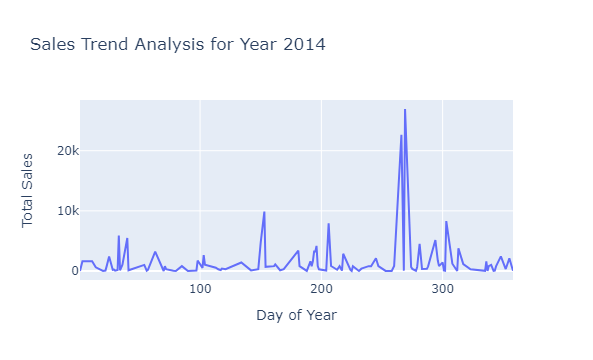

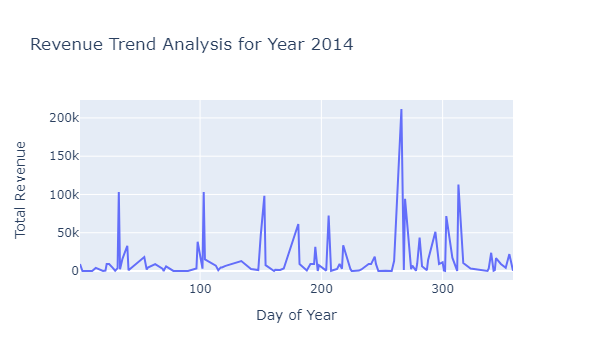

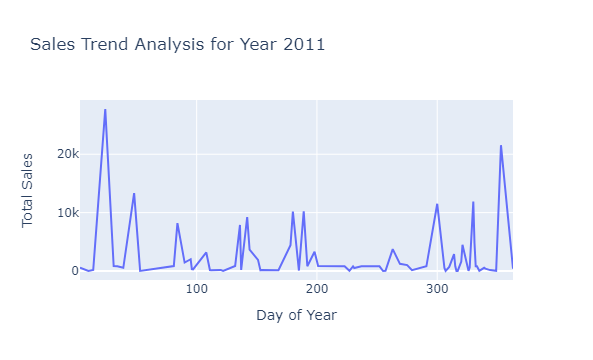

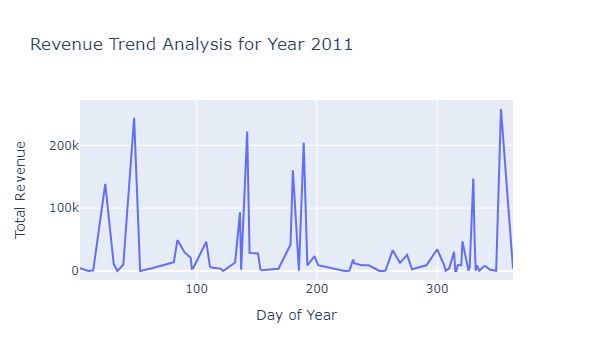

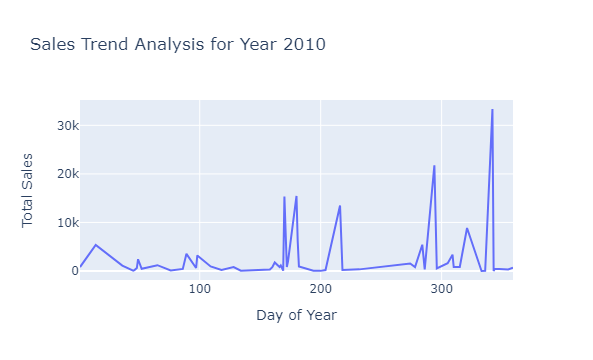

...

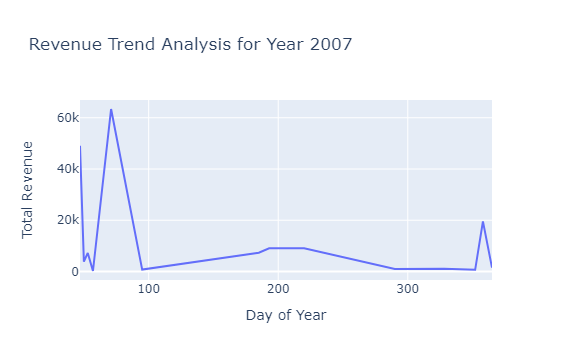

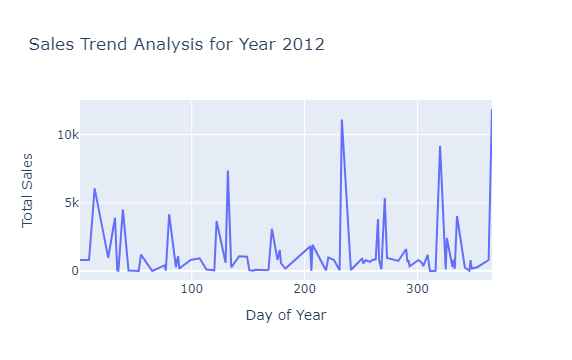

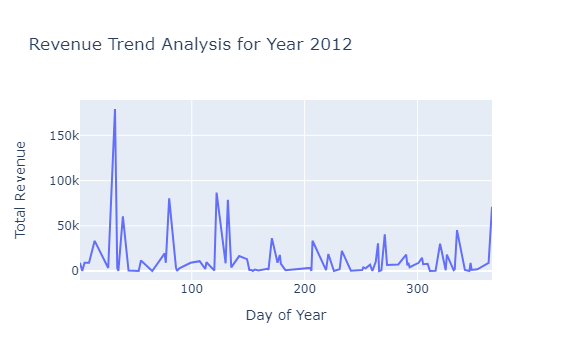

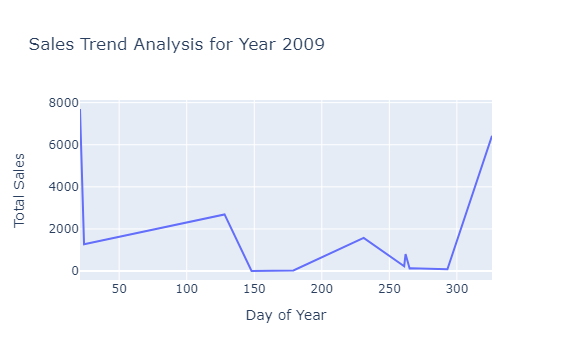

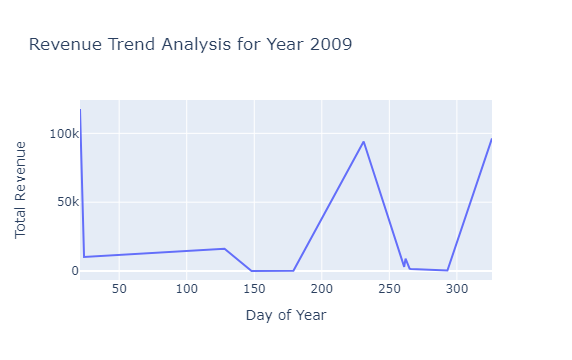

In [278]:
# Iterate over each year and create line plots for each day
years = df['year'].unique()
for year in years:
    year_data = grouped_data[grouped_data['year'] == year]
    fig = px.line(year_data, x='day_of_year', y='sales', 
                     title=f'Sales Trend Analysis for Year {year}',
                     labels={'day_of_year': 'Day of Year', 'sales': 'Total Sales'})
    fig.show()
    
    fig = px.line(year_data, x='day_of_year', y='revenue', 
                     title=f'Revenue Trend Analysis for Year {year}',
                     labels={'day_of_year': 'Day of Year', 'revenue': 'Total Revenue'})
    fig.show()

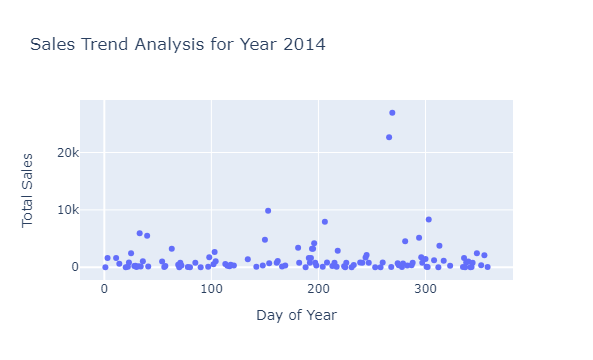

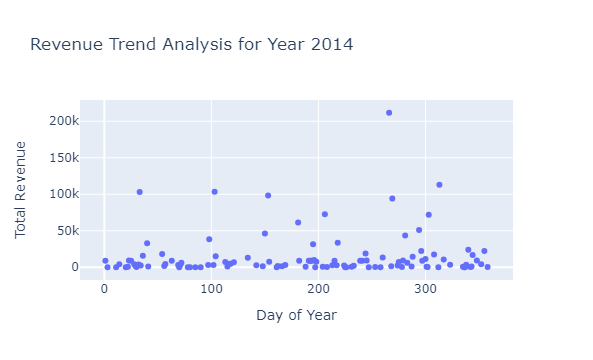

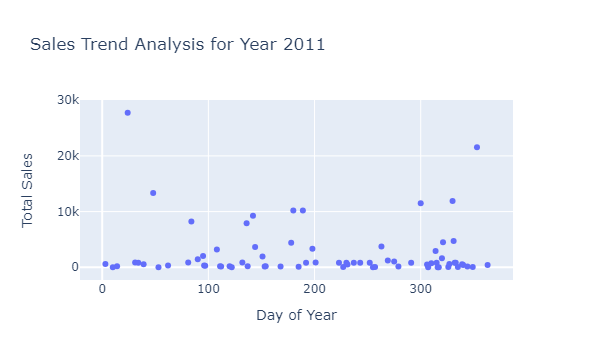

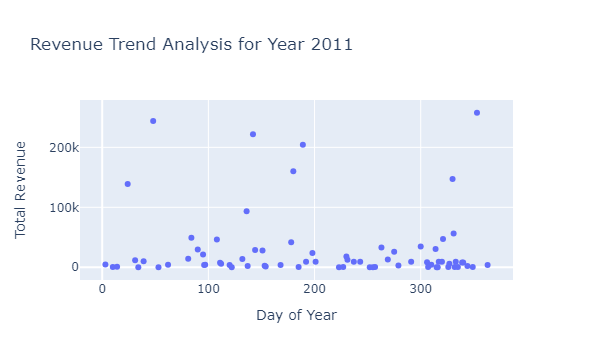

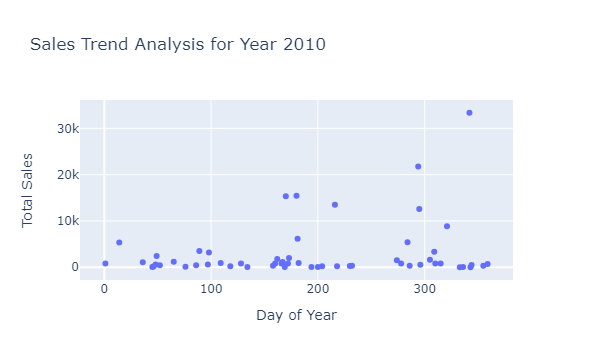

...

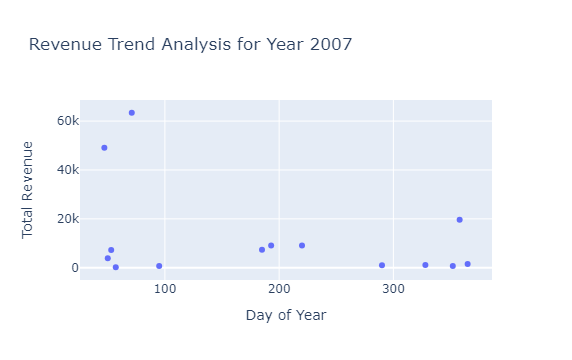

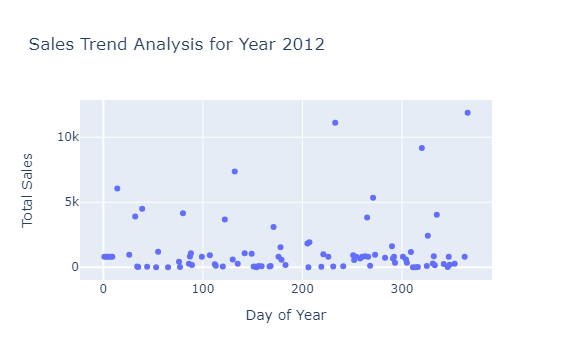

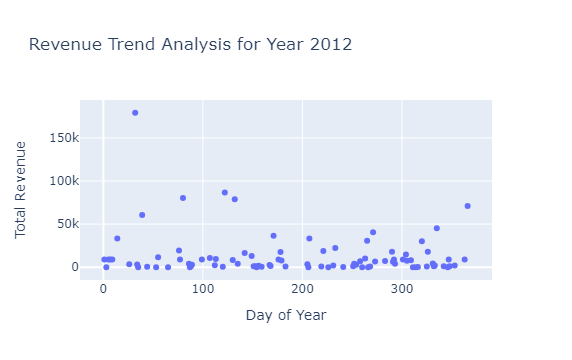

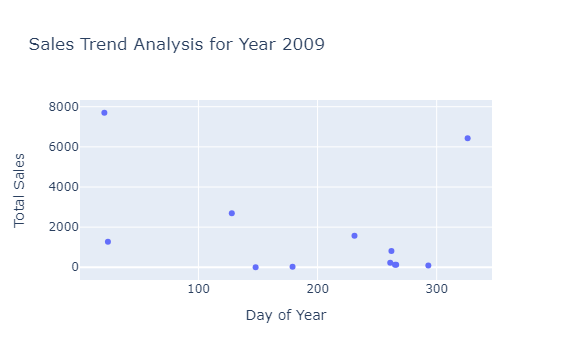

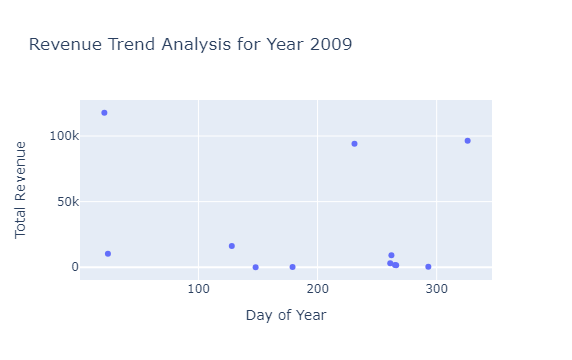

In [279]:
# Iterate over each year and create scatter plots for each day
for year in years:
    year_data = grouped_data[grouped_data['year'] == year]
    fig = px.scatter(year_data, x='day_of_year', y='sales', 
                     title=f'Sales Trend Analysis for Year {year}',
                     labels={'day_of_year': 'Day of Year', 'sales': 'Total Sales'})
    fig.show()
    
    fig = px.scatter(year_data, x='day_of_year', y='revenue', 
                     title=f'Revenue Trend Analysis for Year {year}',
                     labels={'day_of_year': 'Day of Year', 'revenue': 'Total Revenue'})
    fig.show()

In [280]:
# Group data by year and month
grouped_data = df.groupby(['year', 'month']).agg({'sales': 'sum', 'revenue': 'sum'}).reset_index()

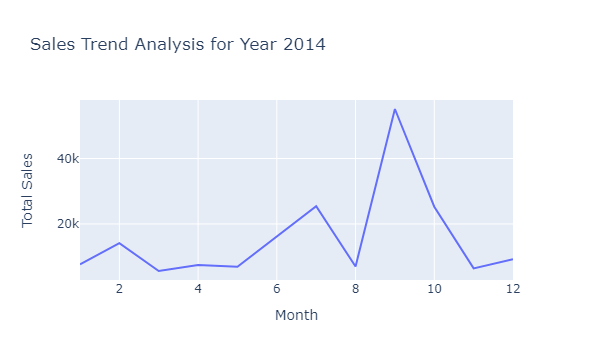

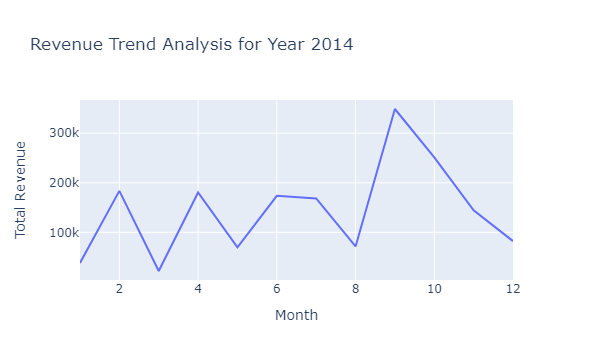

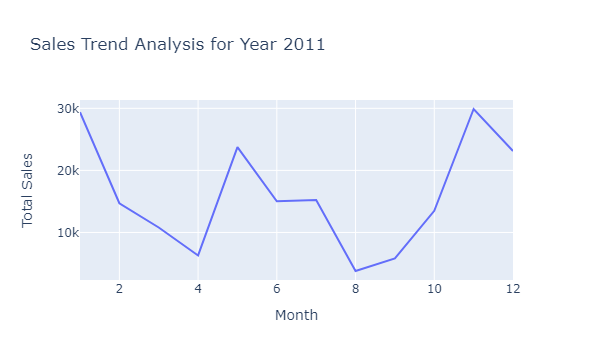

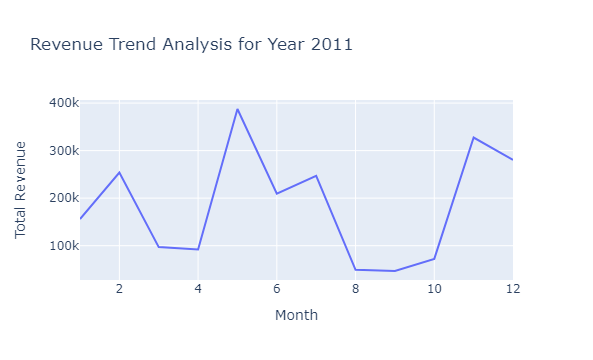

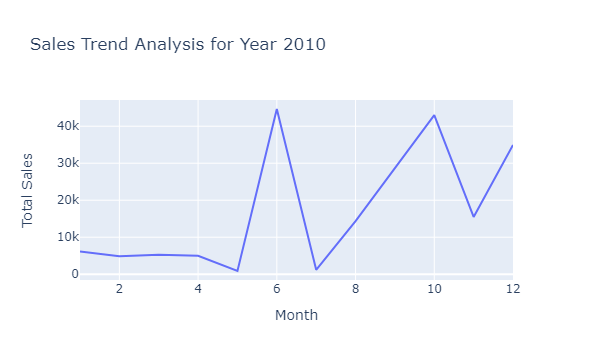

...

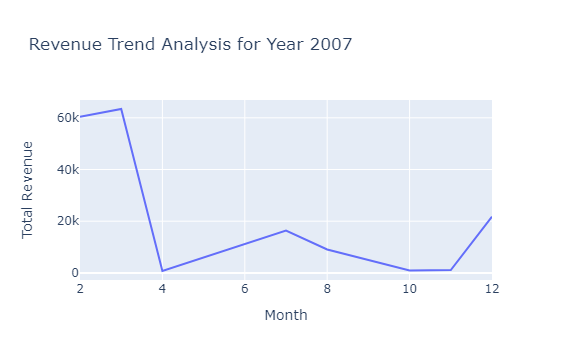

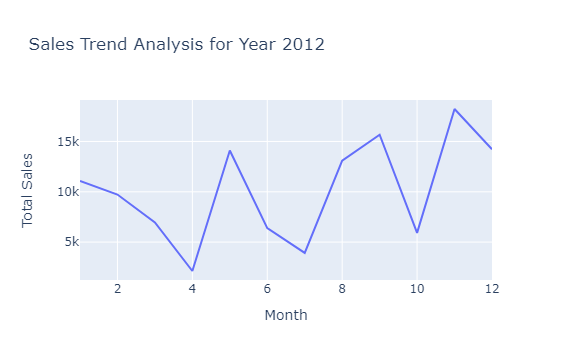

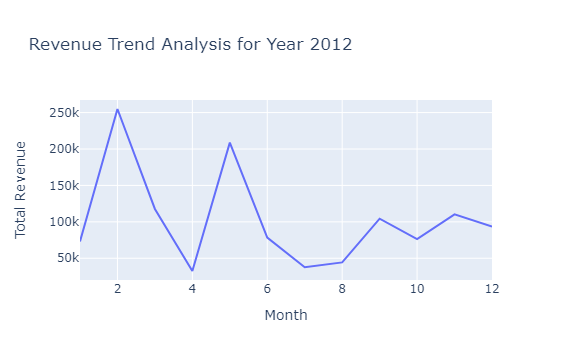

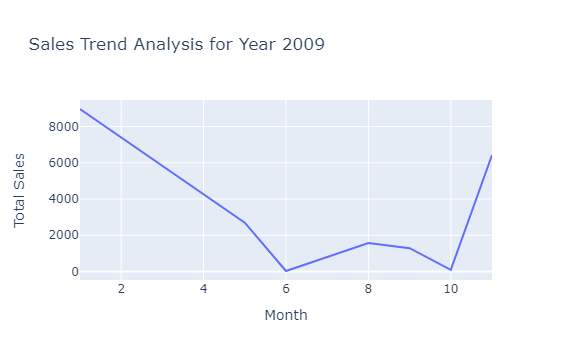

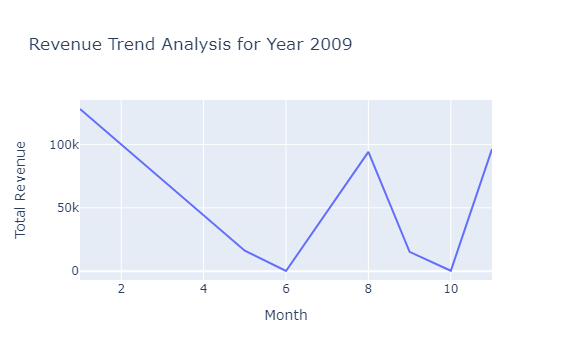

In [281]:
# Iterate over each year and create line plots for each month
for year in years:
    year_data = grouped_data[grouped_data['year'] == year]
    fig = px.line(year_data, x='month', y='sales', 
                  title=f'Sales Trend Analysis for Year {year}',
                  labels={'month': 'Month', 'sales': 'Total Sales'})
    fig.show()
    
    fig = px.line(year_data, x='month', y='revenue', 
                  title=f'Revenue Trend Analysis for Year {year}',
                  labels={'month': 'Month', 'revenue': 'Total Revenue'})
    fig.show()

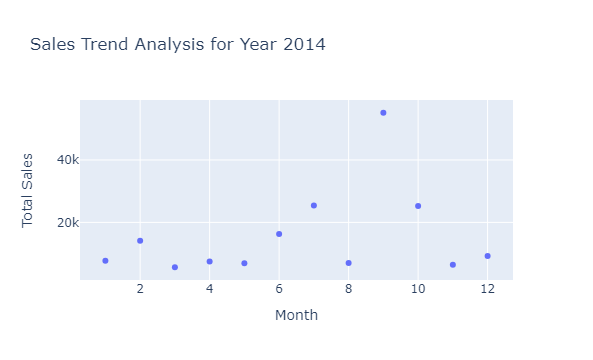

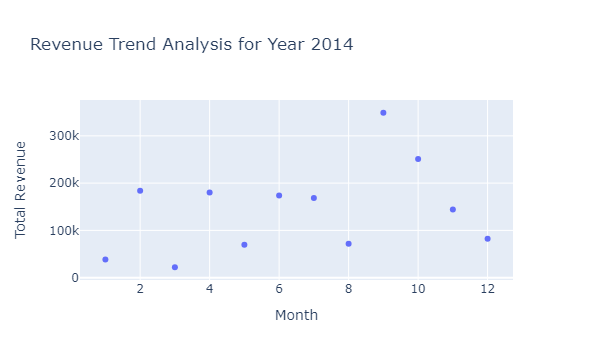

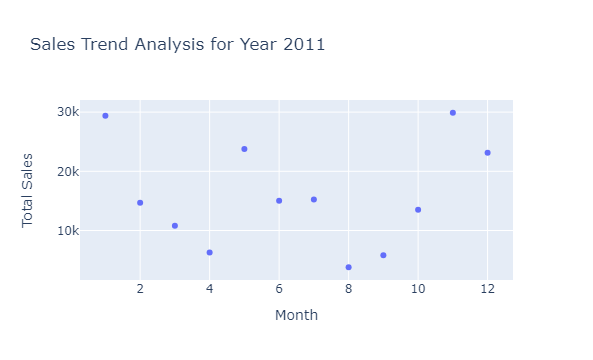

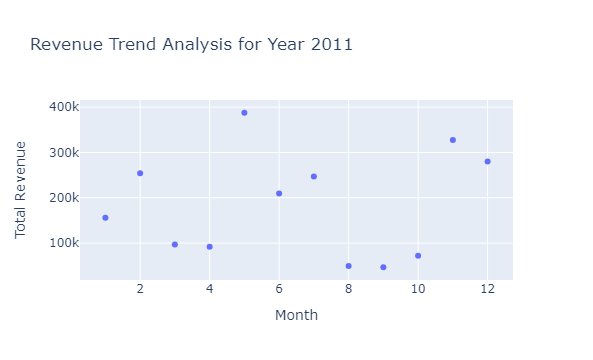

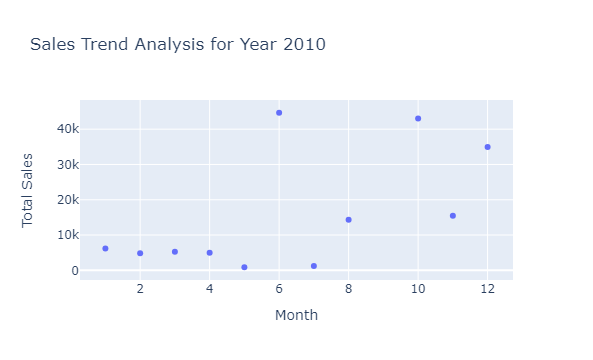

...

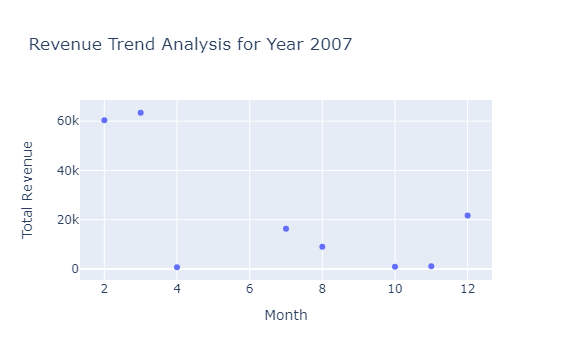

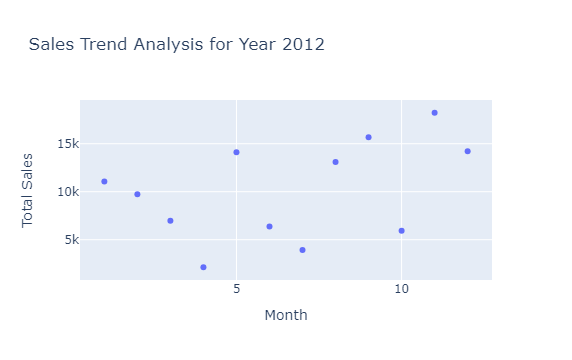

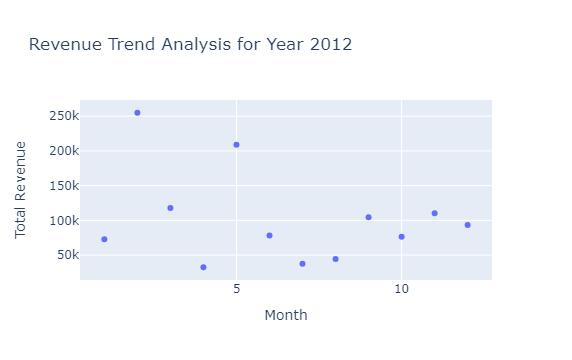

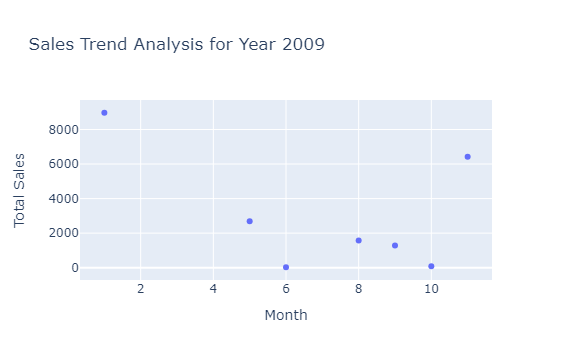

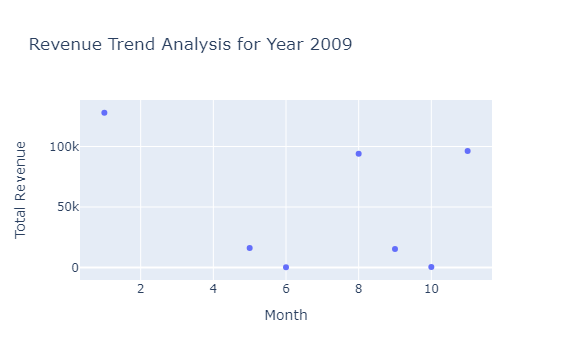

In [282]:
for year in years:
    year_data = grouped_data[grouped_data['year'] == year]
    fig = px.scatter(year_data, x='month', y='sales', 
                  title=f'Sales Trend Analysis for Year {year}',
                  labels={'month': 'Month', 'sales': 'Total Sales'})
    fig.show()
    
    fig = px.scatter(year_data, x='month', y='revenue', 
                  title=f'Revenue Trend Analysis for Year {year}',
                  labels={'month': 'Month', 'revenue': 'Total Revenue'})
    fig.show()

In [283]:
# Group data by year and find the date with maximum sales and revenue for each year
yearly_max_sales = df.groupby(['year'])['sales'].max()
yearly_min_sales = df.groupby(['year'])['sales'].min()
yearly_max_revenue = df.groupby(['year'])['revenue'].max()
yearly_min_revenue = df.groupby(['year'])['revenue'].min()

In [284]:
# Combine the results into a DataFrame
yearly_sales_summary = pd.DataFrame({
    'max_sales': yearly_max_sales,
    'min_sales': yearly_min_sales,
    'max_revenue': yearly_max_revenue,
    'min_revenue': yearly_min_revenue
}).reset_index()

print(yearly_sales_summary)

    year  max_sales  min_sales  max_revenue  min_revenue
0   2006    17196.0       20.0      86444.0        480.0
1   2007    11209.0        1.0      63411.0        189.0
2   2008    13005.0        1.0     130050.0          0.0
3   2009     7698.0        2.0     117702.0          4.0
4   2010    13492.0        0.0     201522.0          0.0
5   2011    15683.0        1.0     243819.0          0.0
6   2012    11718.0        1.0     179168.0          0.0
7   2013    12285.0        0.0     238406.0          0.0
8   2014    13466.0        0.0     112860.0          0.0
9   2015    12886.0        0.0     137084.0          0.0
10  2016    13468.0        0.0     260844.0          0.0
11  2017    23288.0        0.0     292236.0          0.0
12  2018    22586.0        0.0     601965.0          0.0
13  2019    12987.0        0.0     425174.0          0.0
14  2020    12954.0        0.0     336674.0          0.0
15  2021    13163.0        1.0     513528.0          0.0


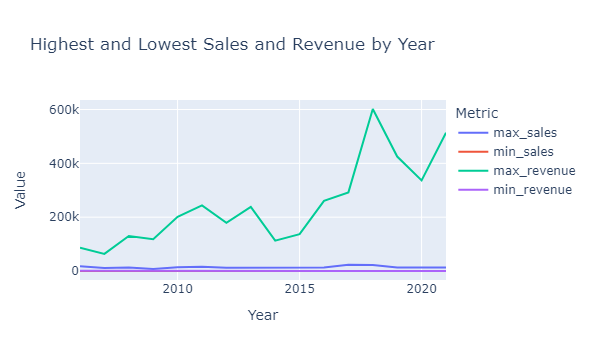

In [285]:
# Create a line plot for highest and lowest sales and revenue
fig = px.line(yearly_sales_summary, x='year', y=['max_sales', 'min_sales', 'max_revenue', 'min_revenue'],
              title='Highest and Lowest Sales and Revenue by Year',
              labels={'year': 'Year', 'value': 'Value', 'variable': 'Metric'},
              line_dash_sequence=['solid', 'dash', 'solid', 'dash'])

fig.show()

# Thanks and Happy !!! Till Now You have completed Visualization 

### Now we will work for Machine Learning

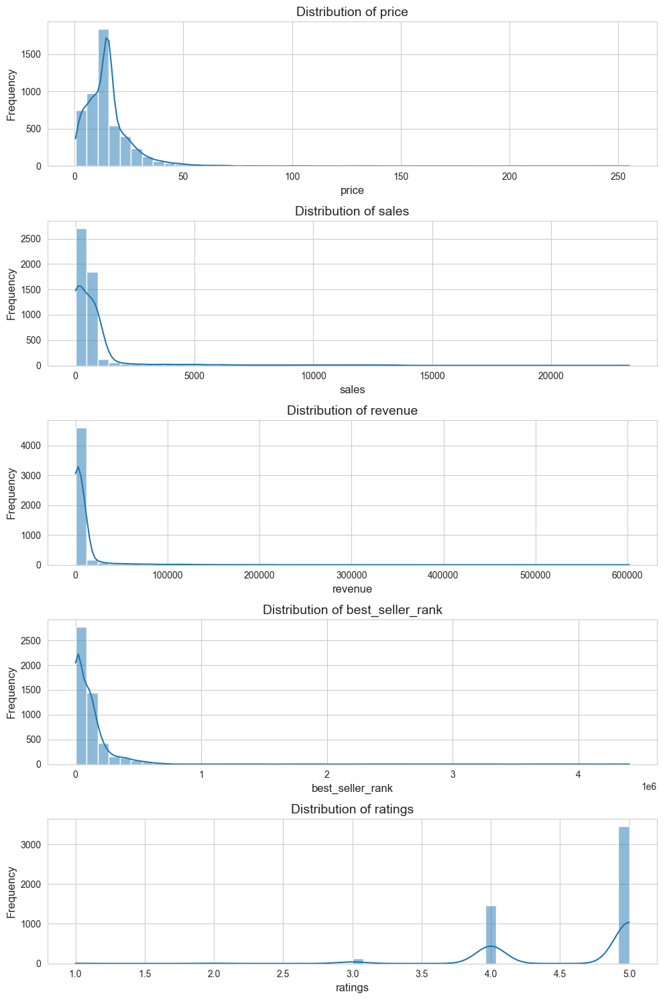

In [374]:
#by visualizing checking whether our data is normally distributed or not
#list of columns to visulaize
columns_to_visualize = ['price', 'sales', 'revenue', 'best_seller_rank', 'ratings']

#set the style
sns.set_style("whitegrid")

#plot distributions for the selected columns
fig, axes = plt.subplots(nrows = len(columns_to_visualize), figsize = (10,15))

for i, col in enumerate(columns_to_visualize):
    sns.histplot(df[col], ax = axes[i], kde = True, bins = 50)
    axes[i].set_title(f'Distribution of {col}', fontsize = 14)
    axes[i].set_xlabel(col, fontsize = 12)
    axes[i].set_ylabel('Frequency', fontsize = 12)

plt.tight_layout()    
plt.show()
                        

##### by seeing above graphs we can say  that our data is not normally distributed 

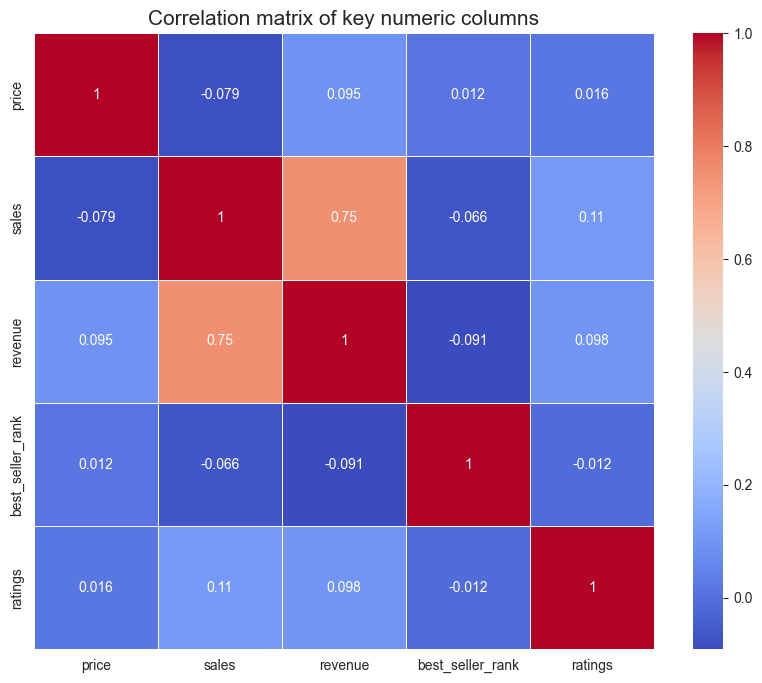

In [375]:
#examine correlations between key numeric columns
correlation_matrix = df[columns_to_visualize].corr()

#plotting the correlation matirx
plt.figure(figsize = (10,8))
sns.heatmap(correlation_matrix, annot = True, cmap = "coolwarm", linewidth = 0.5)
plt.title("Correlation matrix of key numeric columns", fontsize = 15)
plt.show()

In [405]:
data = df.copy()

In [406]:
data.columns

Index(['product_details', 'asin', 'brand', 'price', 'sales', 'revenue',
       'best_seller_rank', 'fba_fees', 'active_sellers', 'ratings',
       'review_count', 'images', 'review_velocity', 'buy_box', 'category',
       'size_tier', 'delivery', 'dimensions', 'weight', 'creation_date',
       'year', 'day_of_year', 'month'],
      dtype='object')

In [407]:
categorical_columns

['size_tier', 'delivery']

In [408]:
data = pd.get_dummies(data, columns = categorical_columns, drop_first = True)

In [409]:
data.head()

,product_details,asin,brand,price,sales,revenue,best_seller_rank,fba_fees,active_sellers,ratings,...,day_of_year,month,size_tier_Large Letter,size_tier_Large Oversize,size_tier_Small Envelope,size_tier_Small Oversize,size_tier_Standard Envelope,size_tier_Standard Parcel,delivery_FBA,delivery_MFN
0,Lindt Lindor Milk Chocolate Truffles Box - The...,B00NW479QO,Lindt,3.50,13466.0,47131.0,3.0,2.62,30.0,5.0,...,269,9,False,False,False,True,False,False,False,False
1,Andrex Toilet Roll - Gentle Clean Toilet Paper...,B004OCO20E,Andrex,18.28,13338.0,243819.0,2.0,8.38,30.0,5.0,...,48,2,False,True,False,False,False,False,False,False
2,Baileys Original Irish Cream Liqueur 1L,B0049NYI7K,BAILEYS,9.99,11194.0,111828.0,4.0,3.93,22.0,5.0,...,294,10,False,True,False,False,False,False,False,False
3,Tassimo Kenco Americano Grande Coffee Pods (Pa...,B016DEGFWI,Tassimo,14.87,13492.0,200626.0,2.0,5.19,11.0,5.0,...,216,8,False,True,False,False,False,False,False,False
4,Tassimo Costa Gingerbread Latte Coffee Pods (P...,B07JVF2FCV,Tassimo,45.00,13377.0,601965.0,6.0,11.03,1.0,5.0,...,246,9,False,True,False,False,False,False,True,False


In [410]:
data = data.drop(non_categorical_columns, axis = 1)

In [411]:
data.head()

,price,sales,revenue,best_seller_rank,fba_fees,active_sellers,ratings,review_count,images,review_velocity,...,day_of_year,month,size_tier_Large Letter,size_tier_Large Oversize,size_tier_Small Envelope,size_tier_Small Oversize,size_tier_Standard Envelope,size_tier_Standard Parcel,delivery_FBA,delivery_MFN
0,3.50,13466.0,47131.0,3.0,2.62,30.0,5.0,44069.0,12.0,868.0,...,269,9,False,False,False,True,False,False,False,False
1,18.28,13338.0,243819.0,2.0,8.38,30.0,5.0,40397.0,5.0,830.0,...,48,2,False,True,False,False,False,False,False,False
2,9.99,11194.0,111828.0,4.0,3.93,22.0,5.0,3827.0,6.0,235.0,...,294,10,False,True,False,False,False,False,False,False
3,14.87,13492.0,200626.0,2.0,5.19,11.0,5.0,28800.0,5.0,466.0,...,216,8,False,True,False,False,False,False,False,False
4,45.00,13377.0,601965.0,6.0,11.03,1.0,5.0,27494.0,9.0,223.0,...,246,9,False,True,False,False,False,False,True,False


In [412]:
corr = data.corr()
corr


,price,sales,revenue,best_seller_rank,fba_fees,active_sellers,ratings,review_count,images,review_velocity,...,day_of_year,month,size_tier_Large Letter,size_tier_Large Oversize,size_tier_Small Envelope,size_tier_Small Oversize,size_tier_Standard Envelope,size_tier_Standard Parcel,delivery_FBA,delivery_MFN
price,1.000000,-0.079112,0.094999,0.011801,0.442680,-0.089206,0.016132,-0.042484,-0.071592,-0.028798,...,-0.008939,-0.004780,-0.031753,0.191673,-0.009037,-0.102920,-0.034720,-0.148873,-0.043341,0.174942
sales,-0.079112,1.000000,0.753231,-0.065833,-0.073628,0.419441,0.113218,0.667282,0.174353,0.242505,...,0.015486,0.013183,-0.011736,0.009347,-0.006722,-0.013658,-0.008796,0.007716,-0.100252,-0.160917
revenue,0.094999,0.753231,1.000000,-0.091174,0.043427,0.253929,0.097994,0.556099,0.161485,0.176873,...,0.007648,0.006433,-0.009567,0.071703,-0.002551,-0.051779,-0.009090,-0.041227,-0.045951,-0.142013
best_seller_rank,0.011801,-0.065833,-0.091174,1.000000,0.032674,-0.150814,-0.012388,-0.085396,-0.129659,-0.039109,...,-0.000207,0.000146,-0.011274,0.040473,-0.003101,-0.019502,-0.014607,-0.042892,-0.175144,0.315807
fba_fees,0.442680,-0.073628,0.043427,0.032674,1.000000,-0.051754,0.003196,-0.052366,-0.053023,-0.032676,...,0.013026,0.012704,-0.022466,0.242124,-0.010548,-0.145875,-0.046749,-0.173339,-0.108932,0.183350
active_sellers,-0.089206,0.419441,0.253929,-0.150814,-0.051754,1.000000,0.092898,0.270722,0.082879,0.075736,...,0.013728,0.010457,-0.005426,-0.004884,-0.008348,0.015668,0.004159,-0.009909,0.052502,-0.188760
ratings,0.016132,0.113218,0.097994,-0.012388,0.003196,0.092898,1.000000,0.121713,0.011207,0.022395,...,0.017467,0.019790,-0.012622,0.025025,-0.026313,-0.004900,-0.013756,-0.021957,-0.049027,0.012648
review_count,-0.042484,0.667282,0.556099,-0.085396,-0.052366,0.270722,0.121713,1.000000,0.171833,0.292475,...,0.019429,0.018448,-0.005700,-0.002079,-0.006604,0.006331,-0.004697,-0.002715,-0.006362,-0.162541
images,-0.071592,0.174353,0.161485,-0.129659,-0.053023,0.082879,0.011207,0.171833,1.000000,0.051117,...,0.015424,0.014987,-0.001040,-0.036502,0.013277,0.004555,0.007757,0.039039,0.135360,-0.326434
review_velocity,-0.028798,0.242505,0.176873,-0.039109,-0.032676,0.075736,0.022395,0.292475,0.051117,1.000000,...,0.017078,0.017257,-0.002018,0.007818,-0.001874,-0.007602,-0.002406,-0.001012,-0.005268,-0.067859


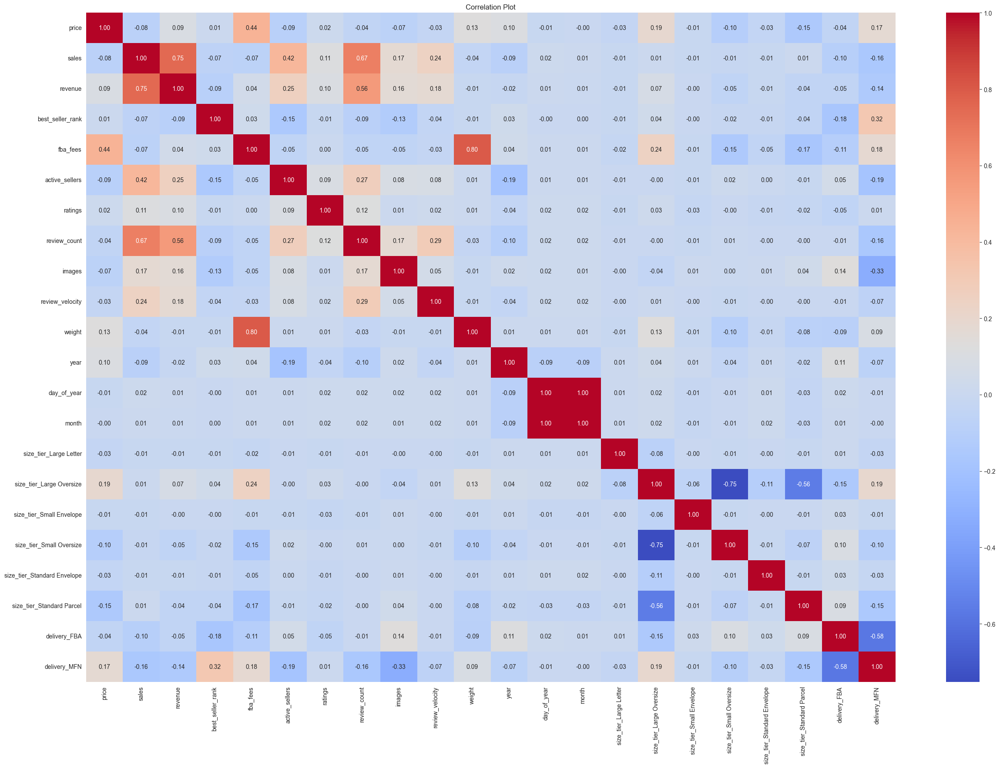

In [413]:
plt.figure(figsize = (30,20))
sns.heatmap(corr, annot = True, cmap = 'coolwarm', fmt = ".2f")
plt.title('Correlation Plot')
fontsize = 1
plt.show()


In [414]:
#set a threshold for correlation
thresold = 0.7

#find highly correlated features
highly_correlated_features = set()

#iterate over the correlations matrix
for i in range(len(corr.columns)):
    for j in range(i):
        if abs(corr.iloc[i,j])> thresold:
            colname = corr.columns[i]
            highly_correlated_features.add(colname)

print("Highly correlated features:", highly_correlated_features)
    

Highly correlated features: {'month', 'revenue', 'weight', 'size_tier_Small Oversize'}


In [415]:
data = data.drop(['weight', 'size_tier_Small Oversize'], axis = 1)

In [416]:
data.head()

,price,sales,revenue,best_seller_rank,fba_fees,active_sellers,ratings,review_count,images,review_velocity,year,day_of_year,month,size_tier_Large Letter,size_tier_Large Oversize,size_tier_Small Envelope,size_tier_Standard Envelope,size_tier_Standard Parcel,delivery_FBA,delivery_MFN
0,3.50,13466.0,47131.0,3.0,2.62,30.0,5.0,44069.0,12.0,868.0,2014,269,9,False,False,False,False,False,False,False
1,18.28,13338.0,243819.0,2.0,8.38,30.0,5.0,40397.0,5.0,830.0,2011,48,2,False,True,False,False,False,False,False
2,9.99,11194.0,111828.0,4.0,3.93,22.0,5.0,3827.0,6.0,235.0,2010,294,10,False,True,False,False,False,False,False
3,14.87,13492.0,200626.0,2.0,5.19,11.0,5.0,28800.0,5.0,466.0,2010,216,8,False,True,False,False,False,False,False
4,45.00,13377.0,601965.0,6.0,11.03,1.0,5.0,27494.0,9.0,223.0,2018,246,9,False,True,False,False,False,True,False


In [417]:
data.columns

Index(['price', 'sales', 'revenue', 'best_seller_rank', 'fba_fees',
       'active_sellers', 'ratings', 'review_count', 'images',
       'review_velocity', 'year', 'day_of_year', 'month',
       'size_tier_Large Letter', 'size_tier_Large Oversize',
       'size_tier_Small Envelope', 'size_tier_Standard Envelope',
       'size_tier_Standard Parcel', 'delivery_FBA', 'delivery_MFN'],
      dtype='object')

In [418]:
data.drop(columns = ['year', 'day_of_year', 'month'], inplace = True)

In [419]:
data.isnull().sum()

price                          0
sales                          0
revenue                        0
best_seller_rank               0
fba_fees                       0
active_sellers                 0
ratings                        0
review_count                   0
images                         0
review_velocity                0
size_tier_Large Letter         0
size_tier_Large Oversize       0
size_tier_Small Envelope       0
size_tier_Standard Envelope    0
size_tier_Standard Parcel      0
delivery_FBA                   0
delivery_MFN                   0
dtype: int64

In [420]:
features_to_process = ['price', 'sales', 'revenue', 'best_seller_rank', 'fba_fees',
       'active_sellers', 'ratings', 'review_count', 'images',
       'review_velocity']

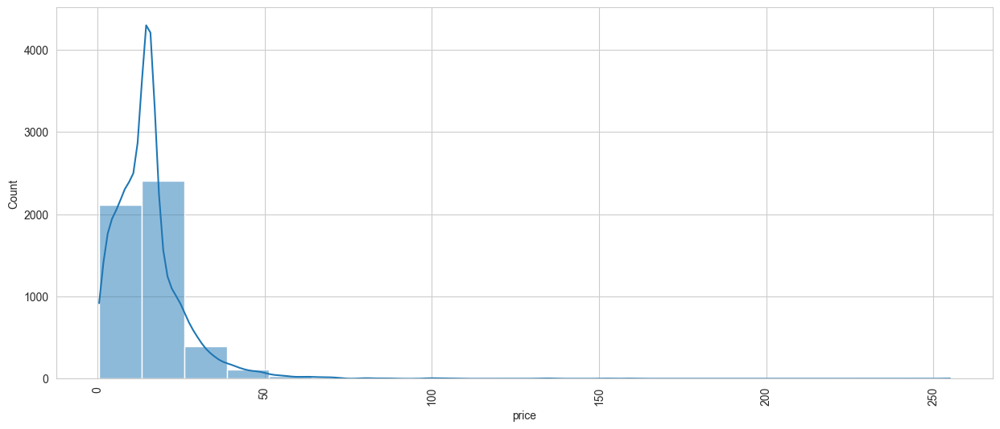

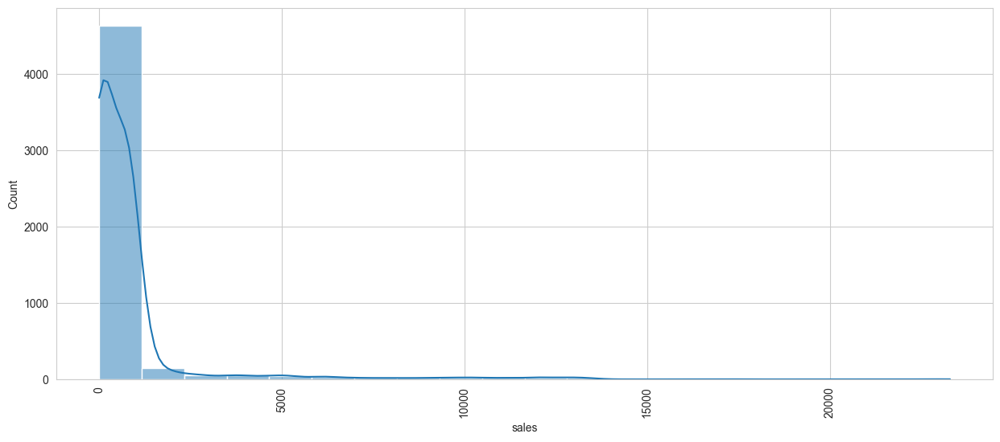

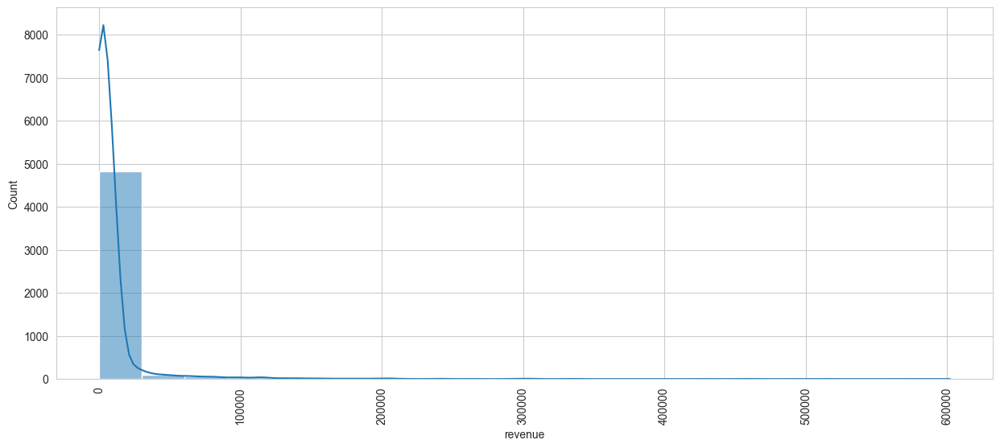

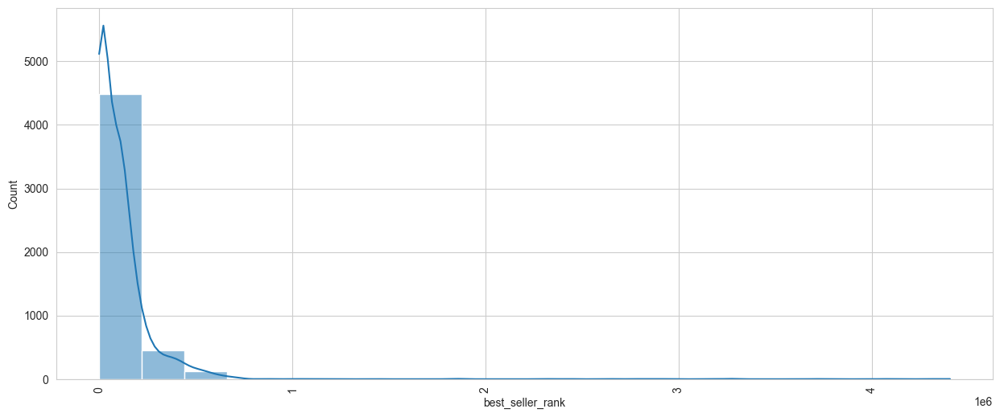

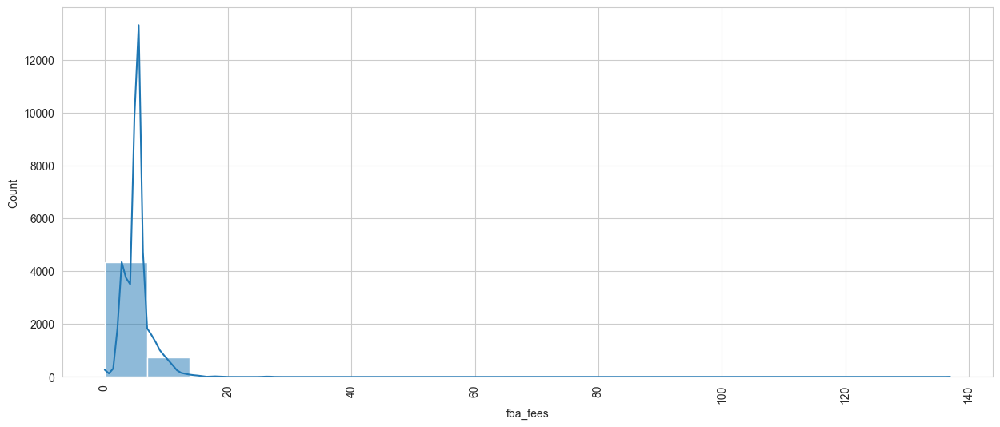

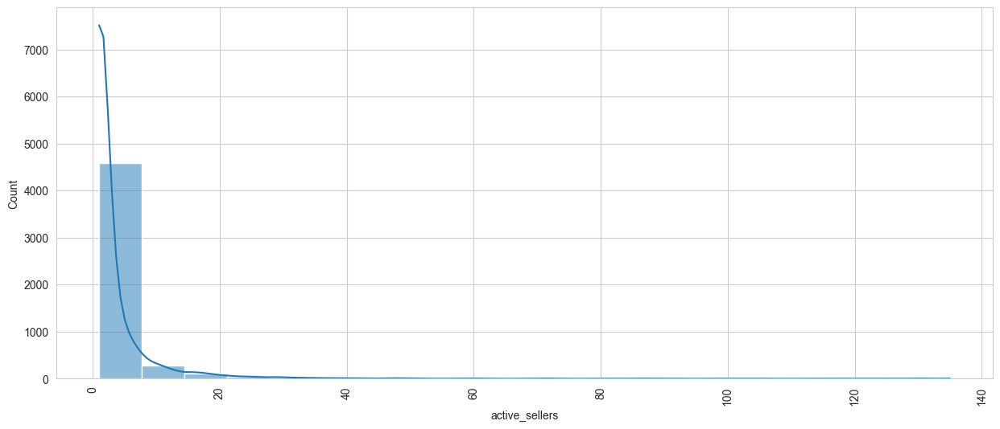

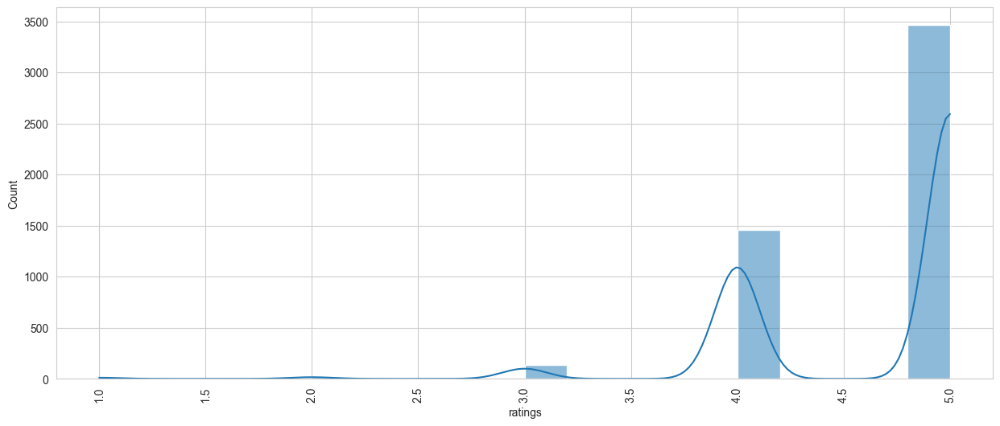

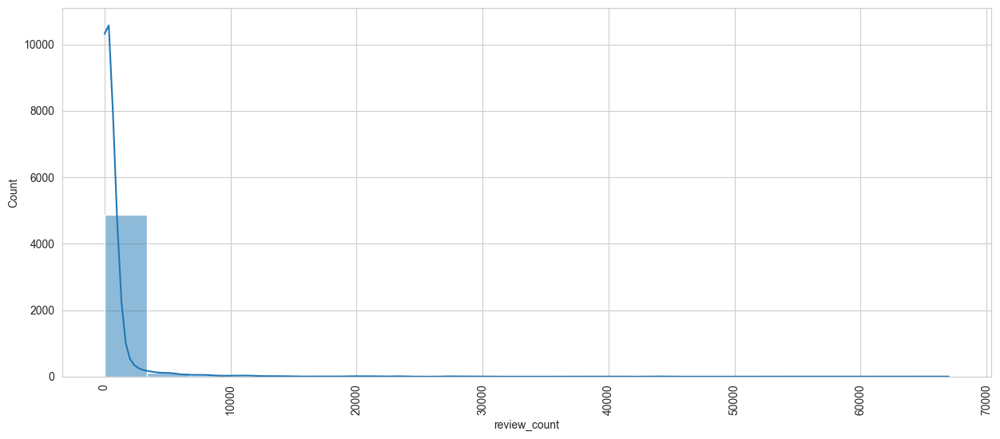

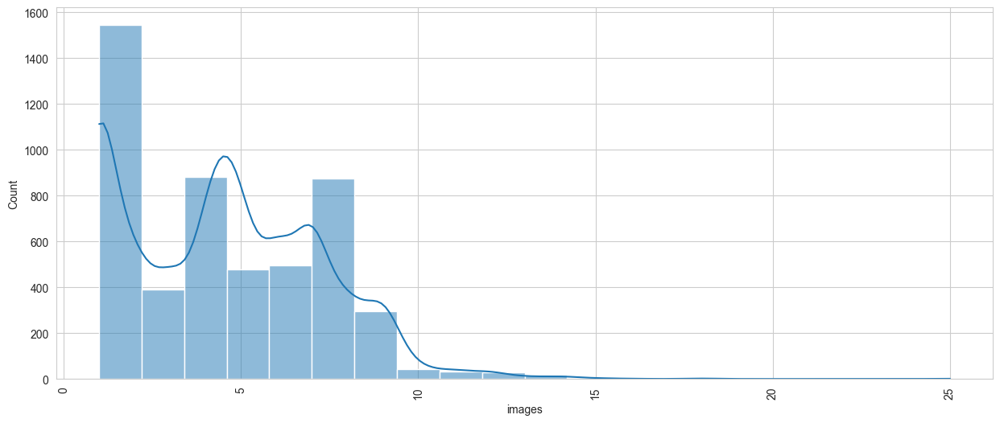

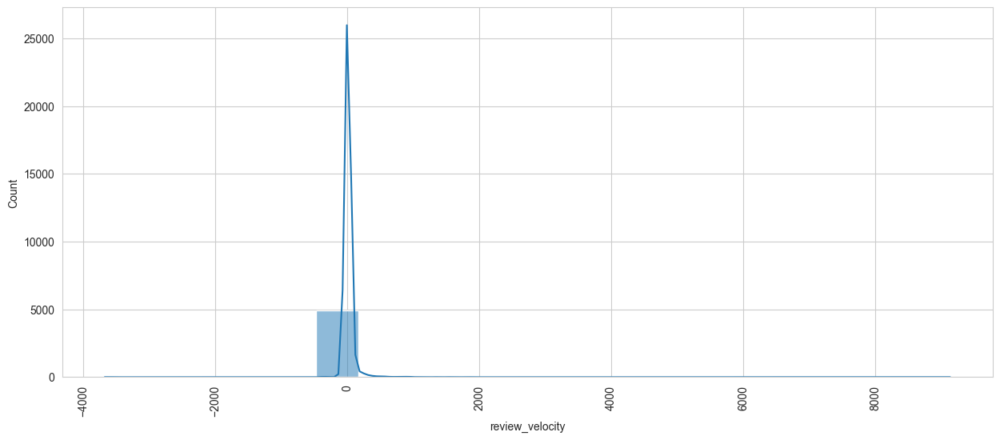

In [421]:
for i in features_to_process:
    plt.figure(figsize =(15,6))
    sns.histplot(data[i], kde = True, bins = 20, palette = 'hls')
    plt.xticks(rotation = 90)
    plt.show()

it's a rule of linear regression that your tagret and rest of the features should be normally distributed 

In [422]:
#filter out not-positive values for the specified features 
for feature in features_to_process:
    data = data[data[feature]>0]

In [423]:
#transforming into normalised data using log
for feature in features_to_process:
    data[f'{feature}_log'] = np.log(data[feature])

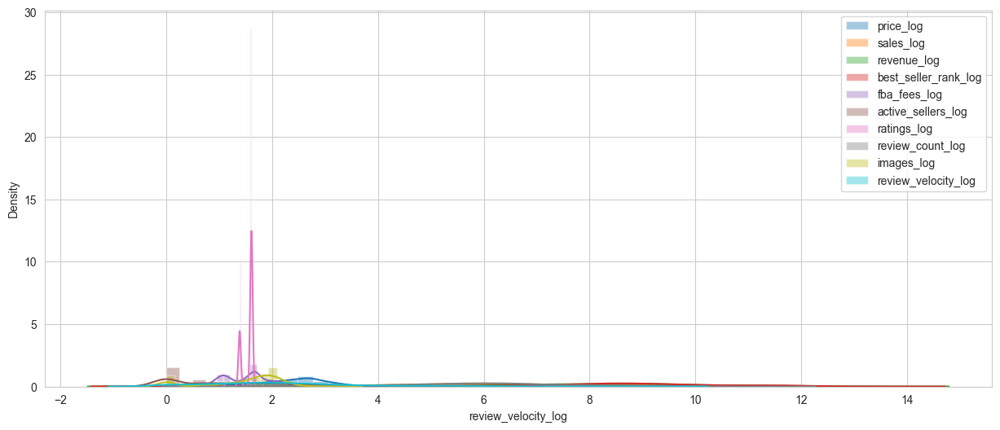

In [424]:

plt.figure(figsize=(15, 6))
for feature in features_to_process:
    sns.distplot(data[f'{feature}_log'], kde=True, bins=20, label=f'{feature}_log')

plt.legend()
plt.xticks(rotation=0)
plt.show()


In [425]:
data.head()

,price,sales,revenue,best_seller_rank,fba_fees,active_sellers,ratings,review_count,images,review_velocity,...,price_log,sales_log,revenue_log,best_seller_rank_log,fba_fees_log,active_sellers_log,ratings_log,review_count_log,images_log,review_velocity_log
0,3.50,13466.0,47131.0,3.0,2.62,30.0,5.0,44069.0,12.0,868.0,...,1.252763,9.507923,10.760686,1.098612,0.963174,3.401197,1.609438,10.693512,2.484907,6.766192
1,18.28,13338.0,243819.0,2.0,8.38,30.0,5.0,40397.0,5.0,830.0,...,2.905808,9.498372,12.404181,0.693147,2.125848,3.401197,1.609438,10.606511,1.609438,6.721426
2,9.99,11194.0,111828.0,4.0,3.93,22.0,5.0,3827.0,6.0,235.0,...,2.301585,9.323133,11.624717,1.386294,1.368639,3.091042,1.609438,8.249836,1.791759,5.459586
3,14.87,13492.0,200626.0,2.0,5.19,11.0,5.0,28800.0,5.0,466.0,...,2.699346,9.509852,12.209198,0.693147,1.646734,2.397895,1.609438,10.268131,1.609438,6.144186
4,45.00,13377.0,601965.0,6.0,11.03,1.0,5.0,27494.0,9.0,223.0,...,3.806662,9.501292,13.307955,1.791759,2.400619,0.000000,1.609438,10.221723,2.197225,5.407172


In [426]:
data.columns

Index(['price', 'sales', 'revenue', 'best_seller_rank', 'fba_fees',
       'active_sellers', 'ratings', 'review_count', 'images',
       'review_velocity', 'size_tier_Large Letter', 'size_tier_Large Oversize',
       'size_tier_Small Envelope', 'size_tier_Standard Envelope',
       'size_tier_Standard Parcel', 'delivery_FBA', 'delivery_MFN',
       'price_log', 'sales_log', 'revenue_log', 'best_seller_rank_log',
       'fba_fees_log', 'active_sellers_log', 'ratings_log', 'review_count_log',
       'images_log', 'review_velocity_log'],
      dtype='object')

In [427]:
#droping the columns which are not affecting more
data = data.drop(['price', 'sales', 'revenue', 'best_seller_rank', 'fba_fees',
       'active_sellers', 'ratings', 'review_count', 'images',
       'review_velocity'], axis = 1)

In [428]:
data.head()

,size_tier_Large Letter,size_tier_Large Oversize,size_tier_Small Envelope,size_tier_Standard Envelope,size_tier_Standard Parcel,delivery_FBA,delivery_MFN,price_log,sales_log,revenue_log,best_seller_rank_log,fba_fees_log,active_sellers_log,ratings_log,review_count_log,images_log,review_velocity_log
0,False,False,False,False,False,False,False,1.252763,9.507923,10.760686,1.098612,0.963174,3.401197,1.609438,10.693512,2.484907,6.766192
1,False,True,False,False,False,False,False,2.905808,9.498372,12.404181,0.693147,2.125848,3.401197,1.609438,10.606511,1.609438,6.721426
2,False,True,False,False,False,False,False,2.301585,9.323133,11.624717,1.386294,1.368639,3.091042,1.609438,8.249836,1.791759,5.459586
3,False,True,False,False,False,False,False,2.699346,9.509852,12.209198,0.693147,1.646734,2.397895,1.609438,10.268131,1.609438,6.144186
4,False,True,False,False,False,True,False,3.806662,9.501292,13.307955,1.791759,2.400619,0.000000,1.609438,10.221723,2.197225,5.407172


In [429]:
processed_features = ['price_log', 'sales_log', 'revenue_log', 'best_seller_rank_log',
       'fba_fees_log', 'active_sellers_log', 'ratings_log', 'review_count_log',
       'images_log', 'review_velocity_log']

In [430]:
processed_features

['price_log',
 'sales_log',
 'revenue_log',
 'best_seller_rank_log',
 'fba_fees_log',
 'active_sellers_log',
 'ratings_log',
 'review_count_log',
 'images_log',
 'review_velocity_log']

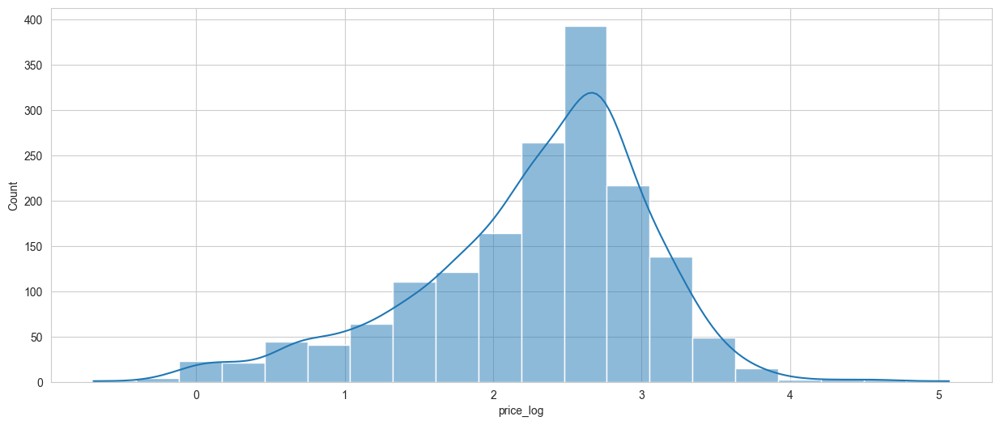

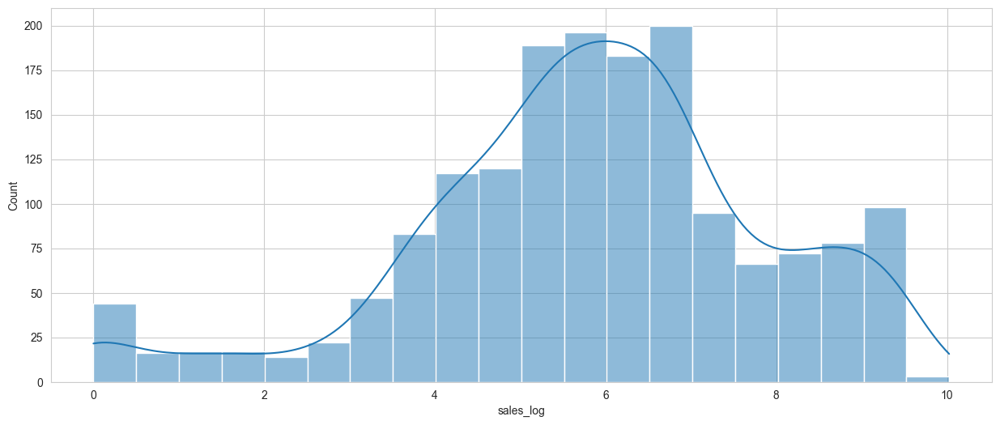

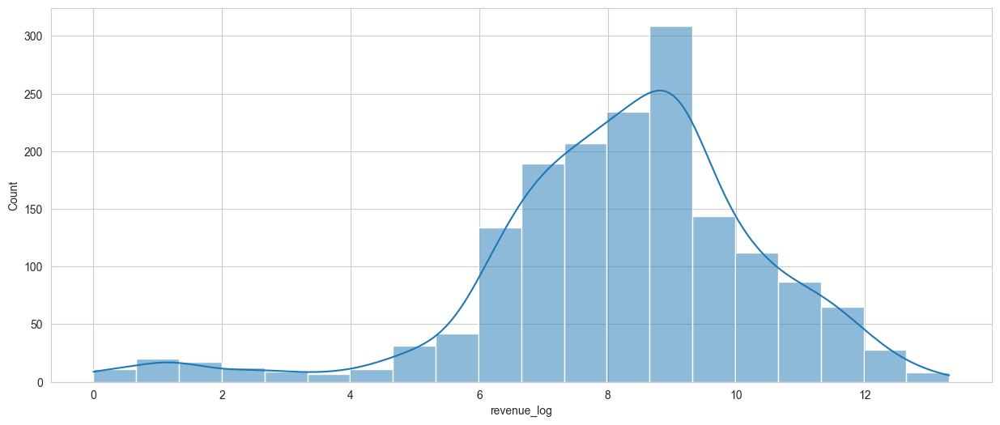

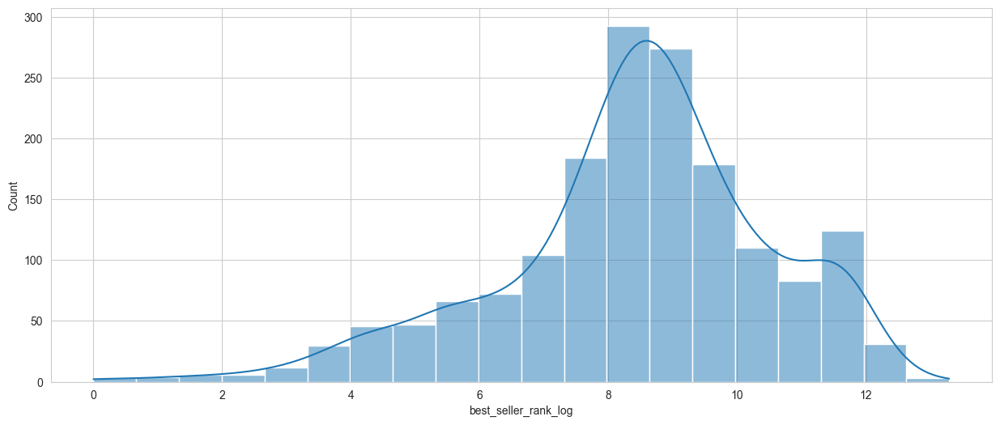

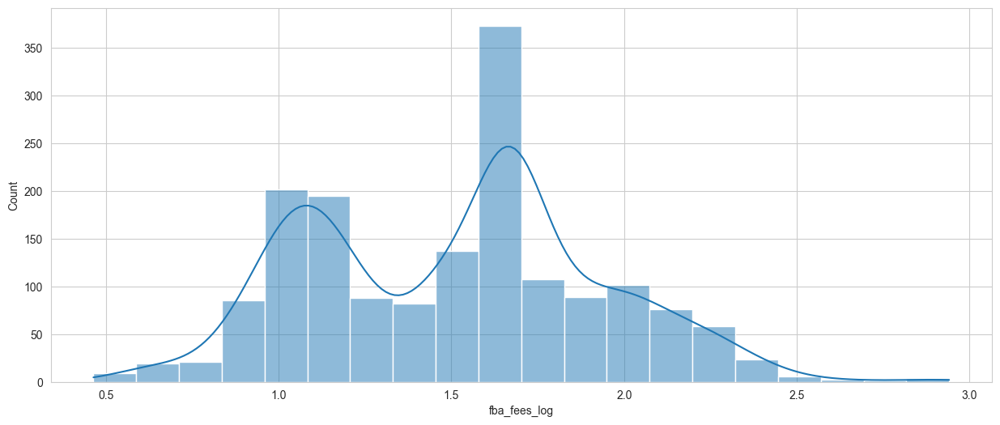

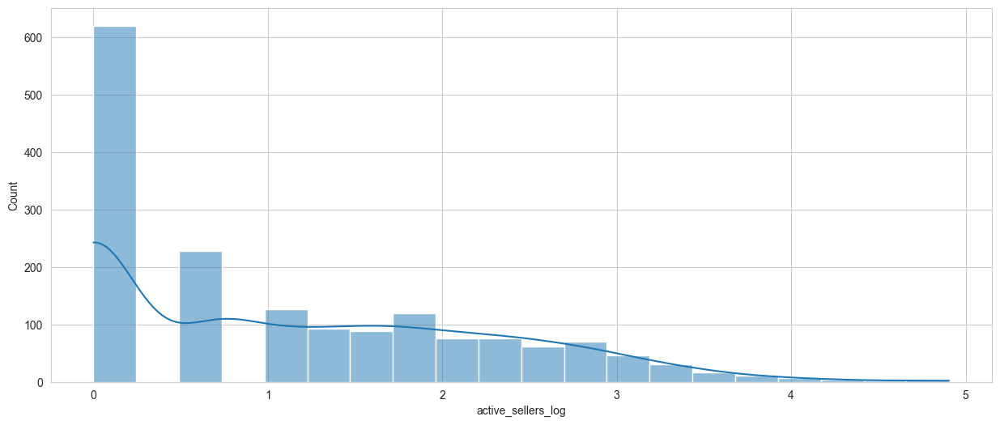

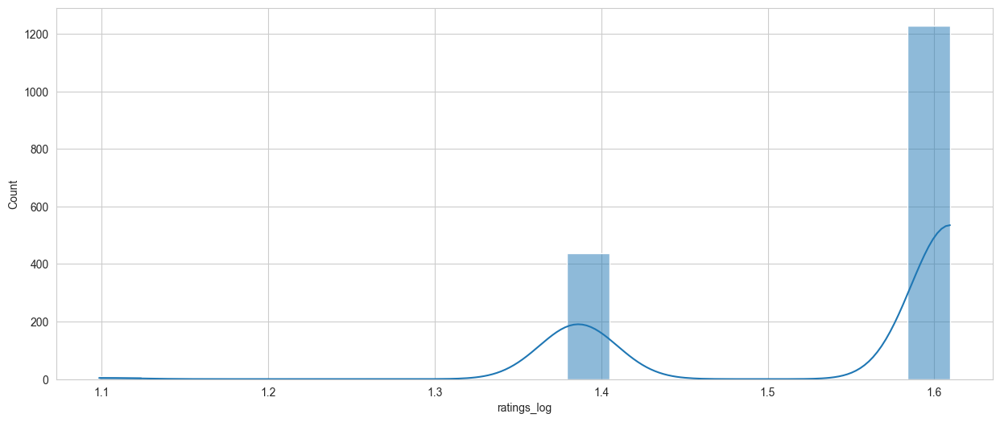

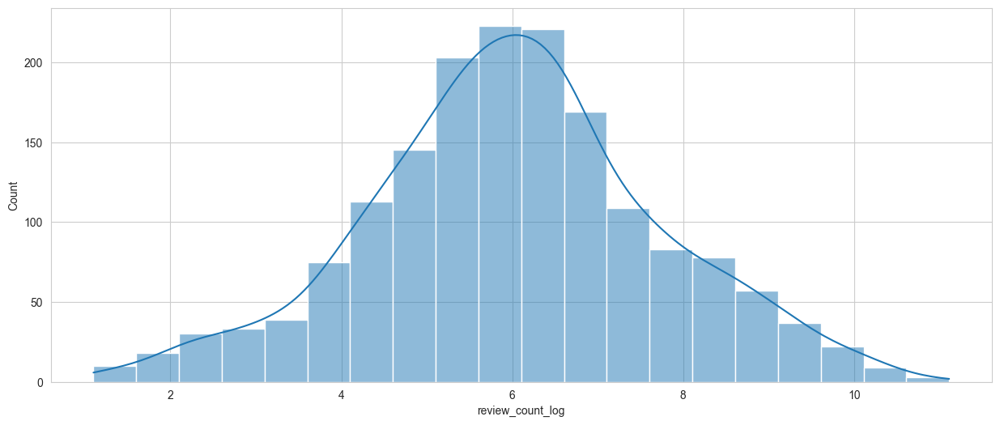

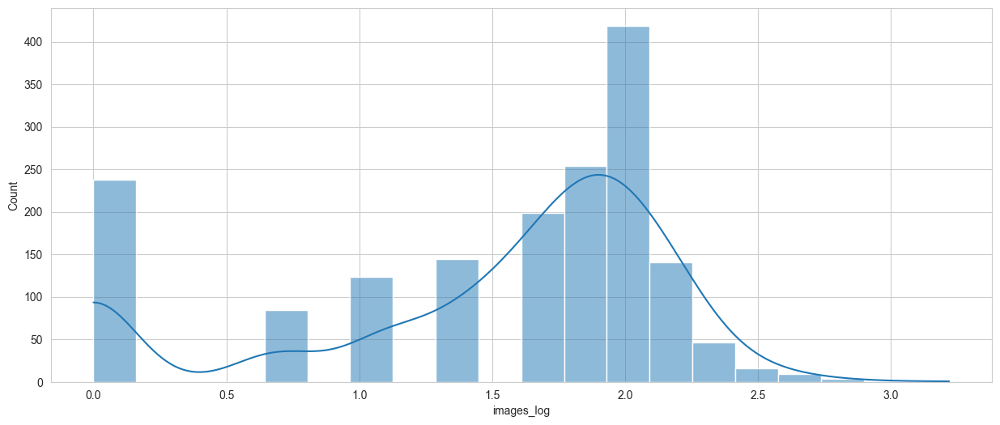

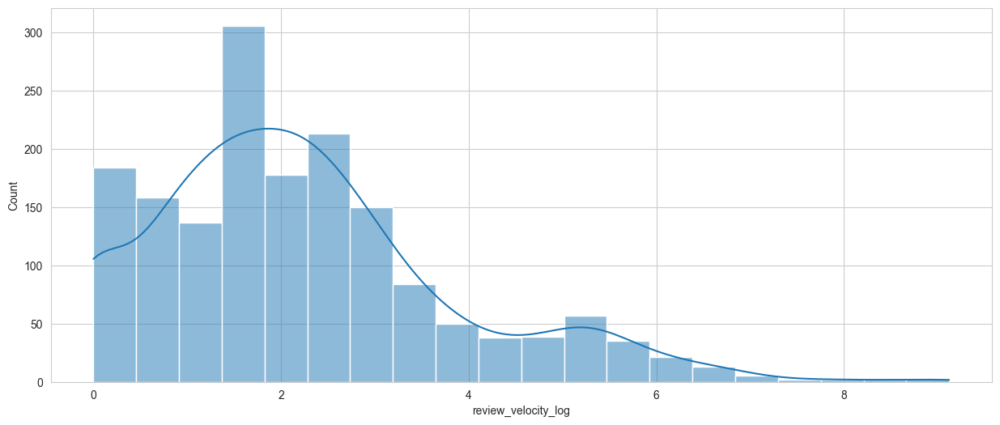

In [431]:
for i in processed_features:
    plt.figure(figsize = (15,6))
    sns.histplot(data[i], kde = True, bins = 20, palette = 'hls')
    plt.xticks(rotation = 0)
    plt.show()

In [432]:
X = data.drop(['sales_log'], axis = 1)
y = data['sales_log']

In [433]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)



In [434]:
pip install xgboost

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.1.2 -> 23.2.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [435]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
import xgboost as xgb
from sklearn.metrics import mean_absolute_error, mean_squared_error,r2_score

In [436]:
model = LinearRegression()
model.fit(X_train, y_train) #fitting our model 

LinearRegression()

In [437]:
y_pred = model.predict(X_test) #predicting our model

In [438]:
mse = mean_squared_error(y_test, y_pred) #predicted value - actual value = residual error and it need to minimum
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2_lr = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse:.2f}")
print(f"Root Mean Squared Error: {rmse:.2f}")
print(f"Mean Absolute Error: {mae:.2f}")
print(f"R-Squared : {r2_lr:.2f}")

Mean Squared Error: 0.29
Root Mean Squared Error: 0.54
Mean Absolute Error: 0.26
R-Squared : 0.92


In [439]:
dt_regressor = DecisionTreeRegressor()


In [440]:
dt_regressor.fit(X_train, y_train)

DecisionTreeRegressor()

In [441]:
y_pred_dt = dt_regressor.predict(X_test)


In [442]:
mse = mean_squared_error(y_test, y_pred_dt) #predicted value - actual value = residual error and it need to minimum
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred_dt)
r2_dt = r2_score(y_test, y_pred_dt)

print(f"Mean Squared Error: {mse:.2f}")
print(f"Root Mean Squared Error: {rmse:.2f}")
print(f"Mean Absolute Error: {mae:.2f}")
print(f"R-Squared : {r2_dt:.2f}")

Mean Squared Error: 0.49
Root Mean Squared Error: 0.70
Mean Absolute Error: 0.34
R-Squared : 0.86


In [443]:
rf_regressor = RandomForestRegressor()


In [444]:
rf_regressor.fit(X_train, y_train)


RandomForestRegressor()

In [445]:
y_pred_rg = rf_regressor.predict(X_test)


In [446]:
mse = mean_squared_error(y_test, y_pred_rg) #predicted value - actual value = residual error and it need to minimum
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred_rg)
r2_rf = r2_score(y_test, y_pred_rg)

print(f"Mean Squared Error: {mse:.2f}")
print(f"Root Mean Squared Error: {rmse:.2f}")
print(f"Mean Absolute Error: {mae:.2f}")
print(f"R-Squared : {r2_rf:.2f}")

Mean Squared Error: 0.23
Root Mean Squared Error: 0.48
Mean Absolute Error: 0.24
R-Squared : 0.94


In [447]:
xgb_regressor = xgb.XGBRegressor(objective = "reg:squarederror")

In [448]:
xgb_regressor.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [449]:
y_pred = xgb_regressor.predict(X_test)


In [450]:
mse = mean_squared_error(y_test, y_pred) #predicted value - actual value = residual error and it need to minimum
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2_xgb = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse:.2f}")
print(f"Root Mean Squared Error: {rmse:.2f}")
print(f"Mean Absolute Error: {mae:.2f}")
print(f"R-Squared : {r2_xgb:.2f}")

Mean Squared Error: 0.22
Root Mean Squared Error: 0.47
Mean Absolute Error: 0.22
R-Squared : 0.94


In [451]:
r2_values = [r2_lr, r2_dt, r2_rf, r2_xgb]
model_names = ['Linear Regression', 'Decision Tree', 'Random Forest', 'XGBBoost Regressor']

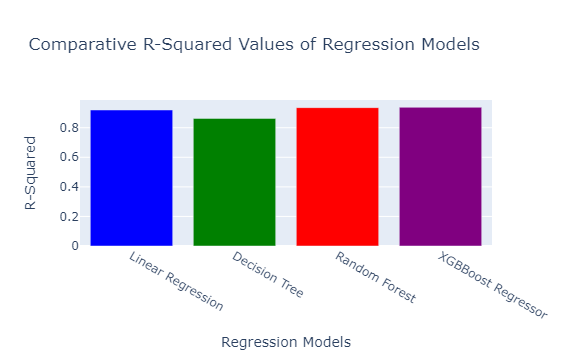

In [452]:
fig = go.Figure()
fig.add_trace(go.Bar(x=model_names, y = r2_values,
                    marker_color = ['blue', 'green', 'red', 'purple']))
fig.update_layout(title = 'Comparative R-Squared Values of Regression Models',
                 xaxis = dict(title = 'Regression Models'),
                 yaxis = dict(title = 'R-Squared'))
fig.show()

In [ ]:
Due to our good preprocessing these algorithms are giving good amount of accuracy 